In [1]:
from reservoirpy.nodes import Reservoir, Ridge
from reservoirpy import set_seed
# set_seed(42)

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.integrate import odeint

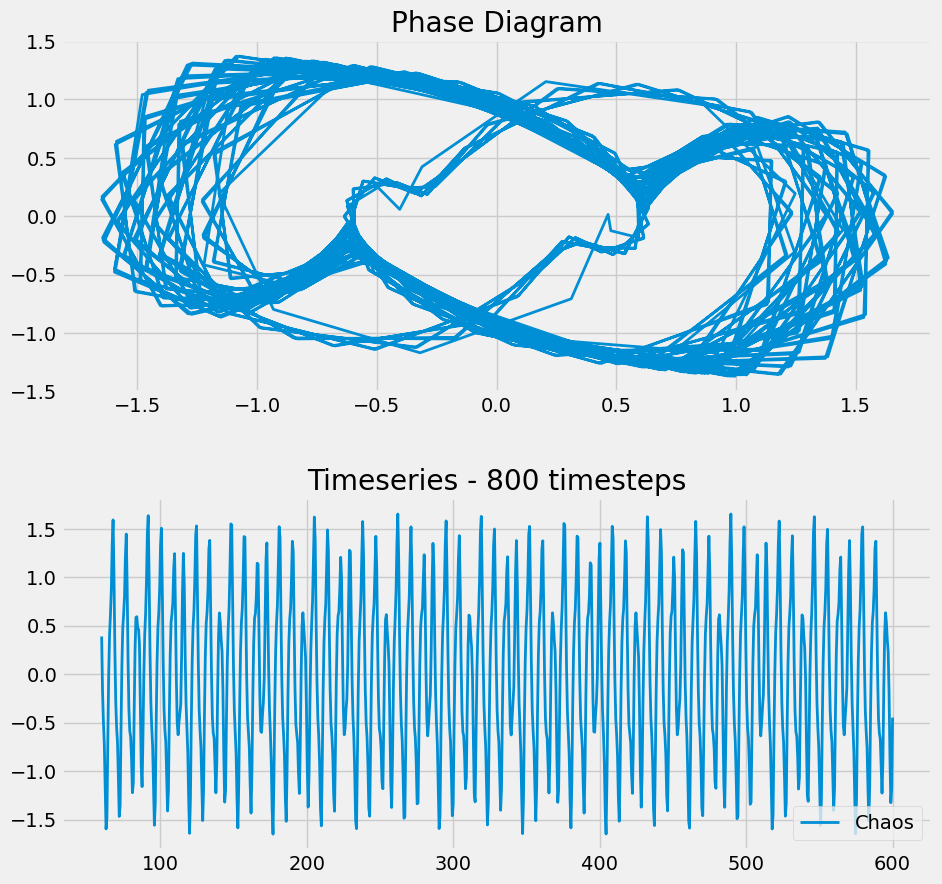

In [393]:
mu=1.53 #8.53
A=1.1
omega = 2.10
def f_1(y, x):
    y1, y2 = y
    #return [y2, mu*(1-y2**2)*y2-y1]
    return [y2, A*np.sin(omega*x)+mu*(1-y2**2)*y2-y1]
x = np.linspace(0,600,1001)
y0 = [0.0001,0.0001]
[y1,y2]=odeint(f_1, y0, x).T
plt.figure(figsize=(10,10))
plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.subplot(211)
plt.plot(y1[100:],y2[100:],linewidth=2)
plt.title('Phase Diagram')
plt.grid(True)
plt.subplot(212)
plt.plot(x[100:],y1[100:],linewidth=2, label='Chaos')
plt.title('Timeseries - 800 timesteps')
plt.legend(loc='best')
plt.grid(True)
plt.show()

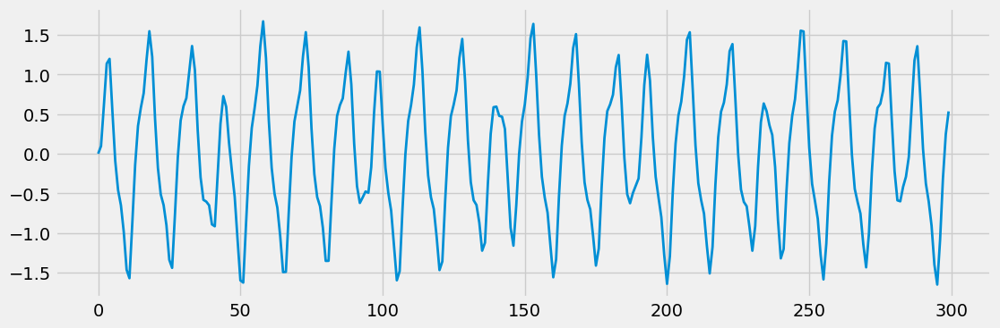

In [396]:
plt.figure(figsize=(12,4))
plt.plot(y1[:300],linewidth=2, label='Хаос')

In [6]:
y1.shape

(1001,)

In [168]:
X_train = y1[:300].reshape(-1, 1)
Y_train = y1[50:350].reshape(-1, 1)

X_test = y1[300:-50].reshape(-1, 1)
Y_test = y1[350:].reshape(-1, 1)

AttributeError: 'numpy.ndarray' object has no attribute 'head'

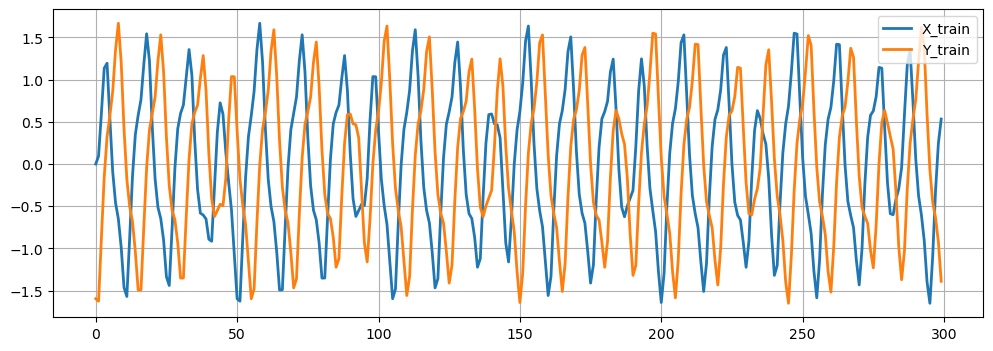

In [211]:
plt.figure(figsize=(12,4))
plt.plot(X_train,linewidth=2, label='X_train')
plt.plot(Y_train,linewidth=2, label='Y_train')
plt.legend()
plt.grid()
plt.show()

In [170]:
from reservoirpy.nodes import Reservoir, Ridge

reservoir1 = Reservoir(100, lr=0.8, sr=0.5, regularization = 1e-8)
# reservoir2 = Reservoir(100, lr=0.5, sr=1.25, connectivity = 0.1, regularization = 1e-8)

readout = Ridge(ridge=1e-7)

esn_model = reservoir1 >> readout
# deep_esn = (reservoir1 >> reservoir2) >> readout
esn_model = esn_model.fit(X_train, Y_train)

Running Model-9:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-9: 300it [00:00, 8525.64it/s]           
Running Model-9: 100%|██████████| 1/1 [00:00<00:00, 11.15it/s]


Fitting node Ridge-9...


In [175]:
# y_pred = esn_model.run(y1[50:].reshape(-1, 1))
y_pred = esn_model.run(X_test)

Running Model-9: 651it [00:00, 18448.40it/s]          


In [176]:
y_pred.shape

(651, 1)

In [178]:
Y_test.shape

(651, 1)

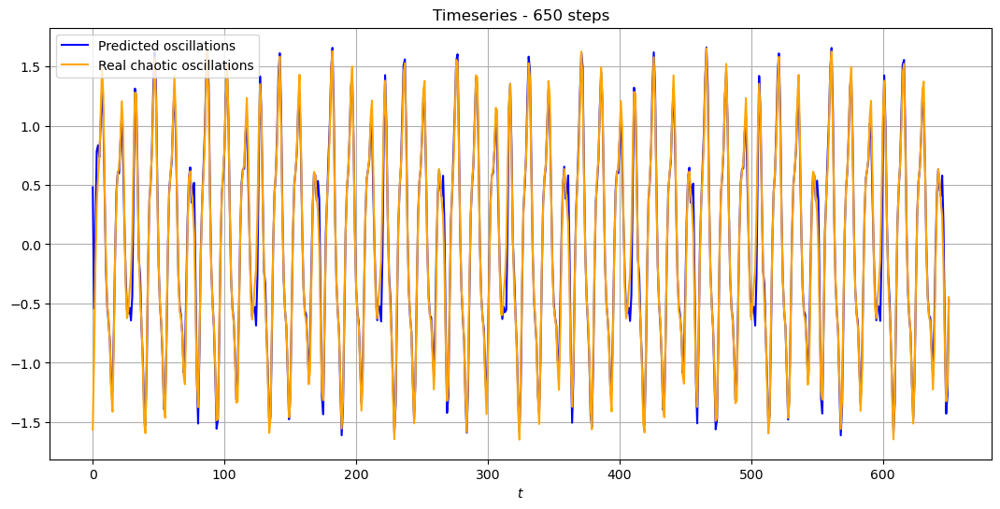

In [180]:
plt.figure(figsize=(13, 6))
plt.title("Timeseries - 650 steps")
plt.xlabel("$t$")
# plt.plot(y_pred[50:600], label="Predicted oscillations ", color="blue")
# plt.plot(y1[:550], label="Real chaotic oscillations", color="orange")
plt.plot(y_pred, label="Predicted oscillations", color="blue")
plt.plot(Y_test, label="Real chaotic oscillations", color="orange")
plt.grid()
plt.legend()
plt.show()

In [181]:
from sklearn.metrics import r2_score, mean_squared_error

r2_esn = r2_score(Y_test, y_pred)
mse_esn = mean_squared_error(Y_test, y_pred)

print(f'R2 of ESN = {round(r2_esn, 3)}\nMSE of ESN = {round(mse_esn, 3)}')


R2 of ESN = 0.972
MSE of ESN = 0.021


In [201]:
def plot_results(y_pred, y_test, sample=y_pred.shape[0]):

    fig = plt.figure(figsize=(15, 9))
    plt.subplot(211)
    plt.plot(np.arange(sample), y_pred[:sample], lw=3, label="ESN prediction")
    plt.plot(np.arange(sample), y_test[:sample], linestyle="--", lw=2, label="True value")
    plt.plot(np.abs(y_test[:sample] - y_pred[:sample]), label="Absolute deviation")

    plt.title('')
    plt.grid()
    plt.legend()
    plt.show()

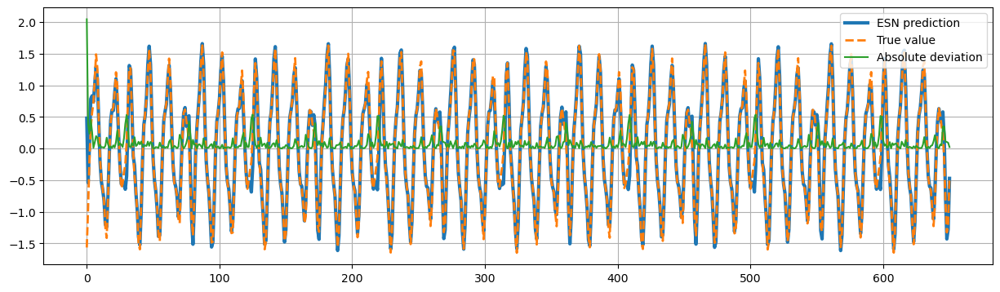

In [202]:
plot_results(y_pred, Y_test)

In [186]:
from statsmodels.tsa.arima.model import ARIMA
import statsmodels.api as sm
import statsmodels.tsa.api as smt

In [190]:
# model = ARIMA(Y_train, order = (1,1,2))
# model_fit = model.fit()
# print(model_fit.summary())

In [109]:
# arima_pred = model_fit.fittedvalues

In [194]:
print('\t ARIMA MODEL : In - Sample Forecasting \n')

history = [x for x in Y_train]
predictions = []

for t in range(len(Y_test)):

    model = ARIMA(history, order=(1,1,2))
    model_fit = model.fit()

    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(float(yhat))

    obs = Y_test[t]
    history.append(obs)

    print(f'predicted = {yhat}, expected = {obs}')

	 ARIMA MODEL : In - Sample Forecasting 

predicted = -1.762773634617204, expected = [-1.56390355]
predicted = -1.3483138364996408, expected = [-0.92900085]
predicted = -0.07328336995996476, expected = [-0.18276807]
predicted = 0.05105819677199086, expected = [0.33067311]
predicted = 0.7245930622127448, expected = [0.57058626]
predicted = 0.5765051813679144, expected = [0.72410877]
predicted = 0.8469766074936658, expected = [1.10217887]
predicted = 1.6364766123273387, expected = [1.48910579]
predicted = 1.5006275949268624, expected = [1.26333361]
predicted = 0.7755390852399895, expected = [0.48290671]
predicted = -0.21630122016050635, expected = [-0.15089556]
predicted = -0.3422389110333238, expected = [-0.50646077]
predicted = -0.7457104313245757, expected = [-0.631931]
predicted = -0.5988510209060092, expected = [-0.83154569]
predicted = -1.1187424442518727, expected = [-1.24588364]
predicted = -1.6594309549809916, expected = [-1.41295426]
predicted = -1.1611380172436179, expected = 

In [195]:
r2_arima = r2_score(Y_test, predictions[:651])
mse_arima = mean_squared_error(Y_test, predictions[:651])

print(f'R2 of ARIMA = {round(r2_arima, 3)}\nMSE of ARIMA = {round(mse_arima, 3)}')

R2 of ARIMA = 0.94
MSE of ARIMA = 0.044


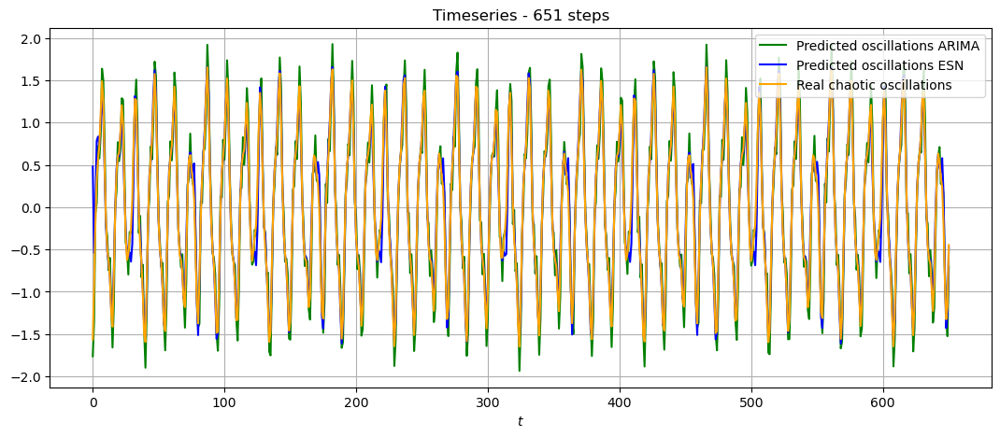

In [207]:
plt.figure(figsize=(13, 5))
plt.title("Timeseries - 651 steps")
plt.xlabel("$t$")
plt.plot(predictions[:651], label="Predicted oscillations ARIMA", color="green")
plt.plot(y_pred, label = "Predicted oscillations ESN", color = 'blue')
plt.plot(Y_test, label="Real chaotic oscillations", color="orange")
plt.grid()
plt.legend()
plt.show()

## Bitcoin prediction

In [624]:
data = pd.read_csv('BTC-USD.csv')
data.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2014-09-17,465.864014,468.174011,452.421997,457.334015,457.334015,21056800
1,2014-09-18,456.859985,456.859985,413.104004,424.440002,424.440002,34483200
2,2014-09-19,424.102997,427.834991,384.532013,394.795990,394.795990,37919700
3,2014-09-20,394.673004,423.295990,389.882996,408.903992,408.903992,36863600
4,2014-09-21,408.084991,412.425995,393.181000,398.821014,398.821014,26580100


In [6]:
from reservoirpy.nodes import Reservoir, Ridge

In [7]:
data.tail()

,Date,Open,High,Low,Close,Adj Close,Volume
2708,2022-02-15,42586.464844,44667.218750,42491.035156,44575.203125,44575.203125,22721659051
2709,2022-02-16,44578.277344,44578.277344,43456.691406,43961.859375,43961.859375,19792547657
2710,2022-02-17,43937.070313,44132.972656,40249.371094,40538.011719,40538.011719,26246662813
2711,2022-02-18,40552.132813,40929.152344,39637.617188,40030.976563,40030.976563,23310007704
2712,2022-02-19,40022.132813,40246.027344,40010.867188,40126.429688,40126.429688,22263900160


In [634]:
X_train_btc = data.Close[:2000].to_numpy().reshape(-1, 1)
Y_train_btc = data.Close[:2300].to_numpy().reshape(-1, 1)

X_test_btc = data.Close[230:].to_numpy().reshape(-1, 1)
Y_test_btc = data.Close[230:].to_numpy().reshape(-1, 1)

In [67]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [635]:
scaler = MinMaxScaler()
scaler.fit(data.Close.to_numpy().reshape(-1, 1))

X_train_btc = scaler.fit_transform(X_train_btc)
Y_train_btc = scaler.transform(Y_train_btc)

X_test_btc = scaler.transform(X_test_btc)
Y_test_btc = scaler.transform(Y_test_btc)

In [9]:
X_test_btc.shape

(413, 1)

In [636]:
reser_btc = Reservoir(100, lr=0.05, sr=1.25, connectivity = 0.1, regularization = 1e-8)

readout_btc = Ridge(ridge=1e-7)

esn_btc = reser_btc >> readout_btc
# deep_esn = (reservoir1 >> reservoir2) >> readout
esn_btc = esn_btc.fit(X_train_btc, Y_train_btc)

Running Model-64:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-64: 2000it [00:00, 9548.00it/s]          
Running Model-64:   0%|          | 0/1 [00:00<?, ?it/s]


ValueError: shapes (1,2300) and (2000,101) not aligned: 2300 (dim 1) != 2000 (dim 0)

In [629]:
y_pred_btc = esn_btc.run(X_test_btc)

Running Model-62: 413it [00:00, 11911.54it/s]          


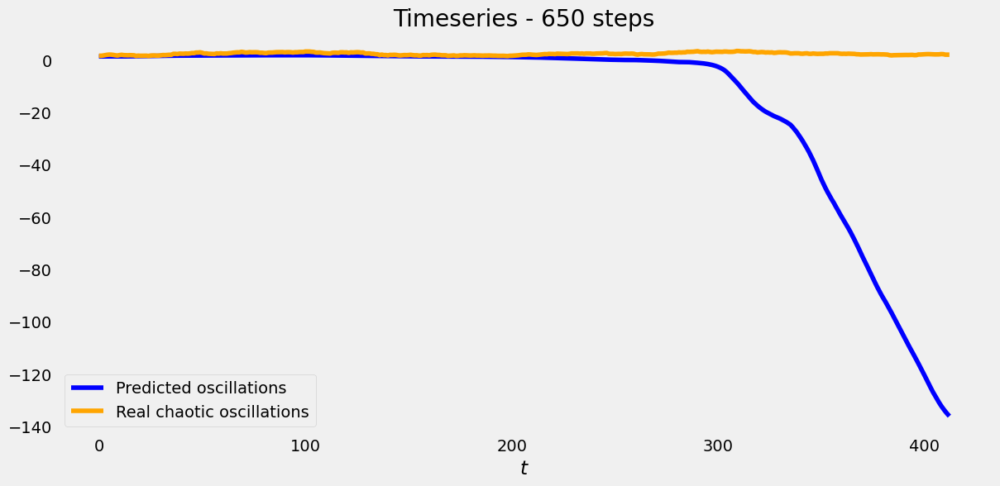

In [630]:
plt.figure(figsize=(13, 6))
plt.title("Timeseries - 650 steps")
plt.xlabel("$t$")
plt.plot(y_pred_btc, label="Predicted oscillations ", color="blue")
plt.plot(Y_test_btc, label="Real chaotic oscillations", color="orange")
plt.grid()
plt.legend()
plt.show()

## Hénon Map

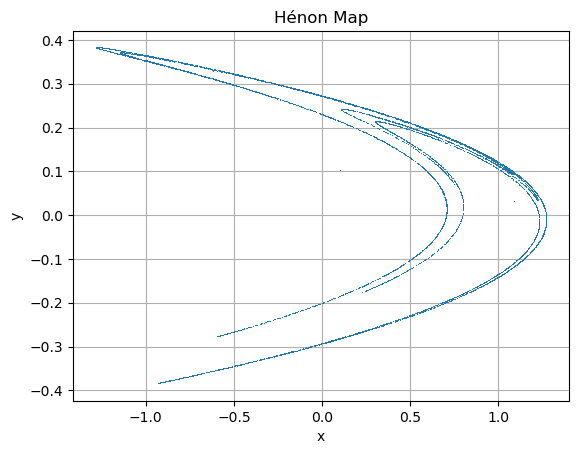

In [19]:
import numpy as np
import matplotlib.pyplot as plt

# Hénon Map parameters
a = 1.4
b = 0.3

# Initial condition
x0, y0 = 0.1, 0.1
length = 10000

# Generate Hénon map
x, y = [x0], [y0]
for _ in range(length-1):
    x_next = 1 - a * x[-1]**2 + y[-1]
    y_next = b * x[-1]
    x.append(x_next)
    y.append(y_next)

# Plot the Hénon map
plt.plot(x, y, ',')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Hénon Map')
plt.grid()



## Rossler Attractor

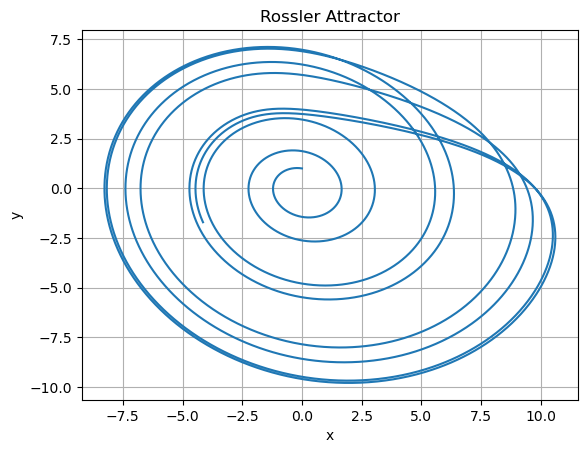

In [20]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt

# Rossler Attractor parameters
a = 0.2
b = 0.2
c = 5.7

# Rossler Attractor equations
def rossler(t, y):
    dydt = [-y[1] - y[2],
            y[0] + a * y[1],
            b + y[2] * (y[0] - c)]
    return dydt

# Initial condition and time span
y0 = [0.0, 1.0, 0.0]
t_span = (0, 50)
t_eval = np.linspace(0, 50, 10000)

# Solve the differential equations
sol = solve_ivp(rossler, t_span, y0, t_eval=t_eval)

# Plot the Rossler attractor
plt.plot(sol.y[0], sol.y[1])
plt.xlabel('x')
plt.ylabel('y')
plt.title('Rossler Attractor')
plt.grid()

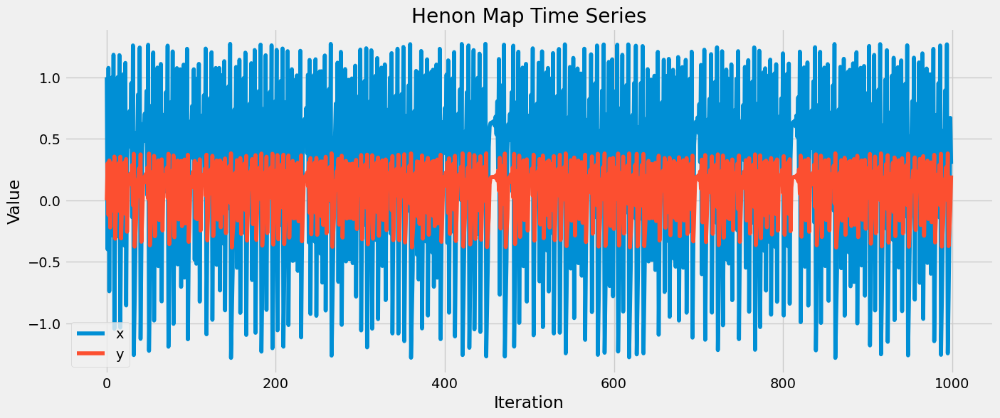

In [1346]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# Henon map parameters
a_henon = 1.4
b_henon = 0.3

# Initial conditions for Henon map
x_henon = 0
y_henon = 0

# Number of iterations for Henon map
n_iterations = 1000

# Arrays to store the Henon map time series
x_series_henon = np.zeros(n_iterations)
y_series_henon = np.zeros(n_iterations)

# Generate Henon map time series
for i in range(n_iterations):
    x_new = 1 - a_henon * x_henon ** 2 + y_henon
    y_new = b_henon * x_henon
    x_henon, y_henon = x_new, y_new
    x_series_henon[i] = x_henon
    y_series_henon[i] = y_henon

# Plot Henon map time series
plt.figure(figsize=(15, 6))
plt.plot(x_series_henon, label='x')
plt.plot(y_series_henon, label='y')
plt.title('Henon Map Time Series')
plt.xlabel('Iteration')
plt.ylabel('Value')
plt.legend()

Text(0.5, 1.0, 'Hénon Map')

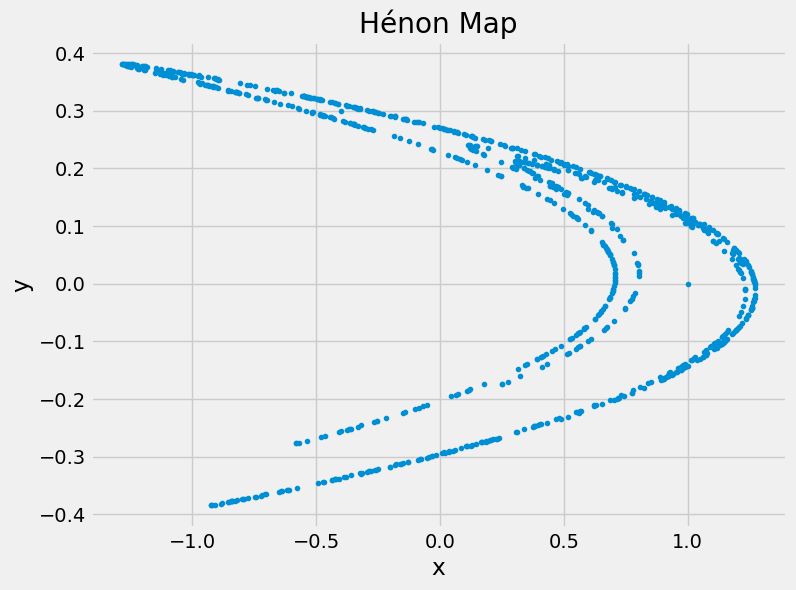

In [1354]:
plt.figure(figsize=(8,6))
plt.plot(x_series_henon, y_series_henon, '.')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Hénon Map')

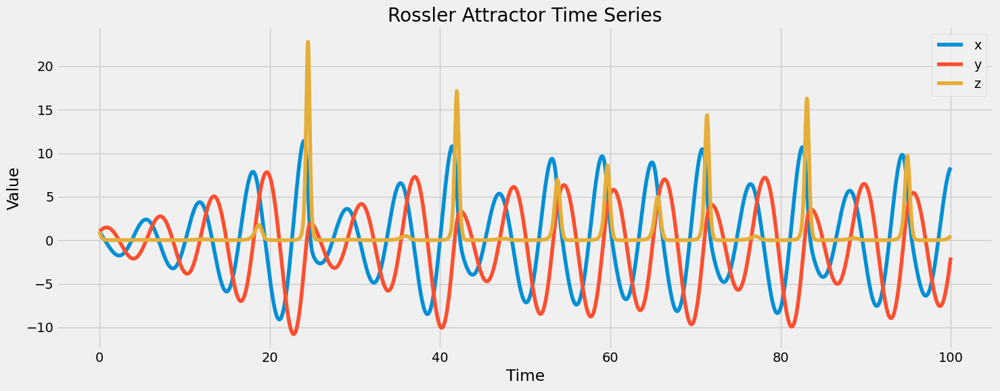

In [329]:
# Rossler Attractor parameters
a_rossler = 0.2
b_rossler = 0.2
c_rossler = 5.7

# Time points for Rossler Attractor
t_start = 0
t_end = 100
t_points = np.linspace(t_start, t_end, 10000)

# Rossler Attractor equations
def rossler(t, state):
    x, y, z = state
    dxdt = -y - z
    dydt = x + a_rossler * y
    dzdt = b_rossler + z * (x - c_rossler)
    return [dxdt, dydt, dzdt]

# Initial conditions for Rossler Attractor
initial_state_rossler = [1, 1, 1]

# Solve the Rossler system
solution_rossler = solve_ivp(rossler, [t_start, t_end], initial_state_rossler, t_eval=t_points)

# Plot Rossler Attractor time series
plt.figure(figsize=(15, 6))
plt.plot(solution_rossler.t, solution_rossler.y[0], label='x')
plt.plot(solution_rossler.t, solution_rossler.y[1], label='y')
plt.plot(solution_rossler.t, solution_rossler.y[2], label='z')
plt.title('Rossler Attractor Time Series')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.tight_layout()

# Infection data

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import openpyxl
import seaborn as sns

color_pal = sns.color_palette()
plt.style.use('fivethirtyeight')
# plt.style.use('default') #default

In [3]:
infections = pd.read_excel('infections_data.xlsx', header=2)
infections.head()

,Unnamed: 0,Unnamed: 1,Всего,0 - 2,3 - 6,7 - 14,15 и ст.,15 - 64,65 и ст.,3 - 4,...,65 и ст..7,3 - 4.7,Всего.8,0 - 2.8,3 - 6.8,7 - 14.8,15 и ст..8,15 - 64.8,65 и ст..8,3 - 4.8
0,1990.1 (01.01.1990 - 07.01.1990),Н,84268,13705,19151,11590,39822,NaN,NaN,NaN,...,NaN,NaN,5025196,207764,272635,487940,4056857,NaN,NaN,NaN
1,1990.2 (08.01.1990 - 14.01.1990),Н,93313,14324,17894,10587,50508,NaN,NaN,NaN,...,NaN,NaN,5025196,207764,272635,487940,4056857,NaN,NaN,NaN
2,1990.3 (15.01.1990 - 21.01.1990),Н,96043,13048,17784,15731,49480,NaN,NaN,NaN,...,NaN,NaN,5025196,207764,272635,487940,4056857,NaN,NaN,NaN
3,1990.4 (22.01.1990 - 28.01.1990),Н,94043,12562,16901,19568,45012,NaN,NaN,NaN,...,NaN,NaN,5025196,207764,272635,487940,4056857,NaN,NaN,NaN
4,1990.5 (29.01.1990 - 04.02.1990),Н,86911,12379,15610,19919,39003,NaN,NaN,NaN,...,NaN,NaN,5025196,207764,272635,487940,4056857,NaN,NaN,NaN


In [474]:
infections.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1608 entries, 0 to 1607
Data columns (total 75 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Unnamed: 0  1608 non-null   object        
 1   Unnamed: 1  1608 non-null   object        
 2   Всего       1608 non-null   int64         
 3   0 - 2       1608 non-null   int64         
 4   3 - 6       1608 non-null   int64         
 5   7 - 14      1608 non-null   int64         
 6   15 и ст.    1608 non-null   int64         
 7   15 - 64     577 non-null    float64       
 8   65 и ст.    577 non-null    float64       
 9   3 - 4       577 non-null    float64       
 10  Всего.1     767 non-null    float64       
 11  0 - 2.1     767 non-null    float64       
 12  3 - 6.1     767 non-null    float64       
 13  7 - 14.1    767 non-null    float64       
 14  15 и ст..1  767 non-null    float64       
 15  15 - 64.1   577 non-null    float64       
 16  65 и ст..1  577 non-null

In [58]:
infections.describe()

,Всего,0 - 2,3 - 6,7 - 14,15 и ст.,15 - 64,65 и ст.,3 - 4,Всего.1,0 - 2.1,...,65 и ст..7,3 - 4.7,Всего.8,0 - 2.8,3 - 6.8,7 - 14.8,15 и ст..8,15 - 64.8,65 и ст..8,3 - 4.8
count,1608.000000,1608.000000,1608.000000,1608.000000,1608.000000,577.000000,577.000000,577.000000,767.000000,767.000000,...,2.0,2.0,1.608000e+03,1608.000000,1608.000000,1608.000000,1.608000e+03,6.170000e+02,617.000000,617.000000
mean,25340.756219,4134.778607,5117.443408,5139.123756,10949.410448,12665.495667,1231.194107,4016.717504,249.237288,17.518905,...,0.0,0.0,4.880194e+06,139876.861940,190374.577114,388868.935323,4.161074e+06,3.586590e+06,781447.076175,96163.228525
std,15986.434110,2346.974505,3437.953008,4355.086090,7169.761994,5240.019887,657.257917,2091.221908,1198.151275,89.605295,...,0.0,0.0,2.496014e+05,38525.723774,51842.208622,103001.873664,2.117380e+05,1.466924e+05,66150.342866,21909.322490
min,1730.000000,452.000000,418.000000,277.000000,446.000000,1524.000000,219.000000,535.000000,0.000000,0.000000,...,0.0,0.0,4.564802e+06,89474.000000,126678.000000,250182.000000,3.949910e+06,3.321333e+06,688652.000000,76036.000000
25%,13863.750000,2436.500000,2454.500000,1450.750000,6201.000000,8404.000000,776.000000,2063.000000,1.000000,0.000000,...,0.0,0.0,4.600276e+06,104700.000000,151443.000000,289047.000000,4.007446e+06,3.353942e+06,718742.000000,76036.000000
50%,23399.000000,3671.500000,4529.000000,4866.500000,9398.500000,12376.000000,1082.000000,4082.000000,6.000000,0.000000,...,0.0,0.0,4.888542e+06,129913.000000,161538.000000,348985.000000,4.042594e+06,3.633947e+06,781894.000000,80569.000000
75%,34464.500000,5510.750000,7181.000000,6969.250000,14358.000000,15715.000000,1613.000000,5747.000000,39.000000,2.000000,...,0.0,0.0,5.034700e+06,180194.000000,247800.000000,493856.000000,4.374156e+06,3.692974e+06,830058.000000,117680.000000
max,155327.000000,14324.000000,27166.000000,44336.000000,70963.000000,38444.000000,4324.000000,13431.000000,17053.000000,1279.000000,...,0.0,0.0,5.383890e+06,207764.000000,282273.000000,520972.000000,4.578669e+06,3.707693e+06,896558.000000,134152.000000


In [59]:
infections['Unnamed: 1'].unique()

array(['Н'], dtype=object)

In [62]:
infections.tail()

,Unnamed: 0,Unnamed: 1,Всего,0 - 2,3 - 6,7 - 14,15 и ст.,15 - 64,65 и ст.,3 - 4,...,65 и ст..7,3 - 4.7,Всего.8,0 - 2.8,3 - 6.8,7 - 14.8,15 и ст..8,15 - 64.8,65 и ст..8,3 - 4.8
1603,2020.39 (21.09.2020 - 27.09.2020),Н,40182,3849,5500,9162,21671,19973.0,1698.0,3052.0,...,NaN,NaN,5383890,196779,259457,348985,4578669,3682111.0,896558.0,134152.0
1604,2020.40 (28.09.2020 - 04.10.2020),Н,35330,3723,5294,6026,20287,18489.0,1798.0,3091.0,...,NaN,NaN,5383890,196779,259457,348985,4578669,3682111.0,896558.0,134152.0
1605,2020.41 (05.10.2020 - 11.10.2020),Н,31983,3616,5442,4850,18075,16228.0,1847.0,3310.0,...,NaN,NaN,5383890,196779,259457,348985,4578669,3682111.0,896558.0,134152.0
1606,2020.42 (12.10.2020 - 18.10.2020),Н,33820,4123,6323,5535,17839,16005.0,1834.0,3764.0,...,NaN,NaN,5383890,196779,259457,348985,4578669,3682111.0,896558.0,134152.0
1607,2020.43 (19.10.2020 - 25.10.2020),Н,37861,4369,7292,6206,19994,17897.0,2097.0,4362.0,...,NaN,NaN,5383890,196779,259457,348985,4578669,3682111.0,896558.0,134152.0


### Lest change column with dates into column of datetime type and make it as index

In [4]:
infections['date'] = pd.date_range (start='1/1/1990', end='10/25/2020', freq='W')

In [64]:
infections['date'].tail()

1603   2020-09-27
1604   2020-10-04
1605   2020-10-11
1606   2020-10-18
1607   2020-10-25
Name: date, dtype: datetime64[ns]

In [5]:
infections_cleared = infections.drop(columns=['Unnamed: 0', 'Unnamed: 1'])
infections_cleared = infections_cleared.set_index('date')
infections_cleared = infections_cleared.drop(infections_cleared.columns[5:], axis=1)

In [66]:
infections_cleared.head()

,Всего,0 - 2,3 - 6,7 - 14,15 и ст.,15 - 64,65 и ст.,3 - 4,Всего.1,0 - 2.1,...,65 и ст..7,3 - 4.7,Всего.8,0 - 2.8,3 - 6.8,7 - 14.8,15 и ст..8,15 - 64.8,65 и ст..8,3 - 4.8
date,,,,,,,,,,,,,,,,,,,,,
1990-01-07,84268,13705,19151,11590,39822,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5025196,207764,272635,487940,4056857,NaN,NaN,NaN
1990-01-14,93313,14324,17894,10587,50508,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5025196,207764,272635,487940,4056857,NaN,NaN,NaN
1990-01-21,96043,13048,17784,15731,49480,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5025196,207764,272635,487940,4056857,NaN,NaN,NaN
1990-01-28,94043,12562,16901,19568,45012,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5025196,207764,272635,487940,4056857,NaN,NaN,NaN
1990-02-04,86911,12379,15610,19919,39003,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,5025196,207764,272635,487940,4056857,NaN,NaN,NaN


In [91]:
infections_cleared.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1608 entries, 1990-01-07 to 2020-10-25
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype
---  ------    --------------  -----
 0   Всего     1608 non-null   int64
 1   0 - 2     1608 non-null   int64
 2   3 - 6     1608 non-null   int64
 3   7 - 14    1608 non-null   int64
 4   15 и ст.  1608 non-null   int64
dtypes: int64(5)
memory usage: 75.4 KB


<Axes: title={'center': 'Patients in St. Petersburg'}, xlabel='date'>

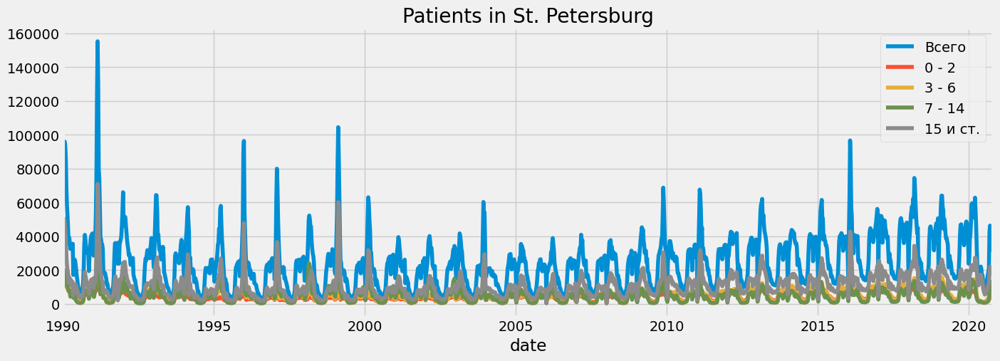

In [98]:
infections_cleared.plot(
    figsize=(15, 5),
    title='Patients in St. Petersburg')

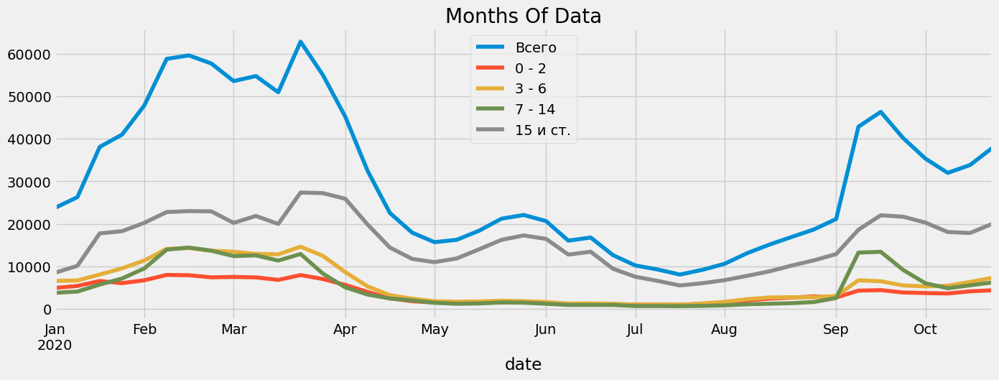

In [107]:
infections_cleared.loc[(infections_cleared.index >= '01-01-2020')] \
    .plot(figsize=(15, 5), title='Months Of Data')
plt.show()

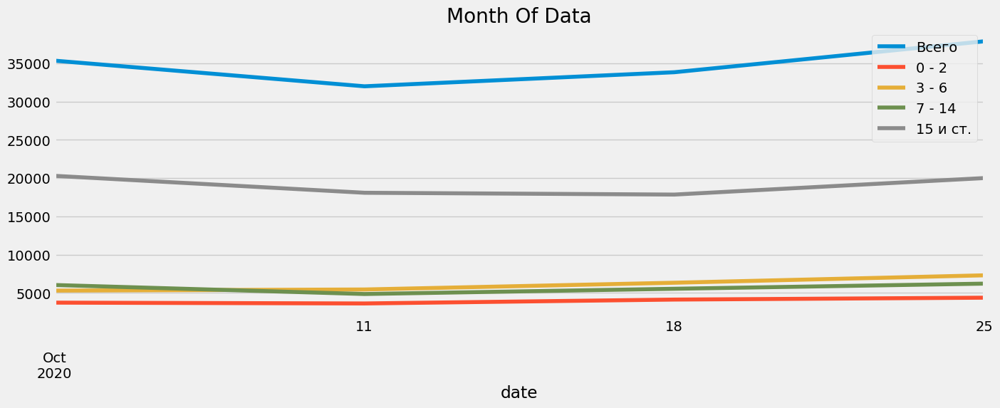

In [108]:
infections_cleared.loc[(infections_cleared.index >= '10-01-2020')] \
    .plot(figsize=(15, 5), title='Month Of Data')
plt.show()

/var/folders/_2/3r2pyzk16rdbwgbf6s6rlngr0000gn/T/ipykernel_1383/822182294.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(infections_cleared['0 - 2'], hist=False, label='0 - 2')
/var/folders/_2/3r2pyzk16rdbwgbf6s6rlngr0000gn/T/ipykernel_1383/822182294.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6

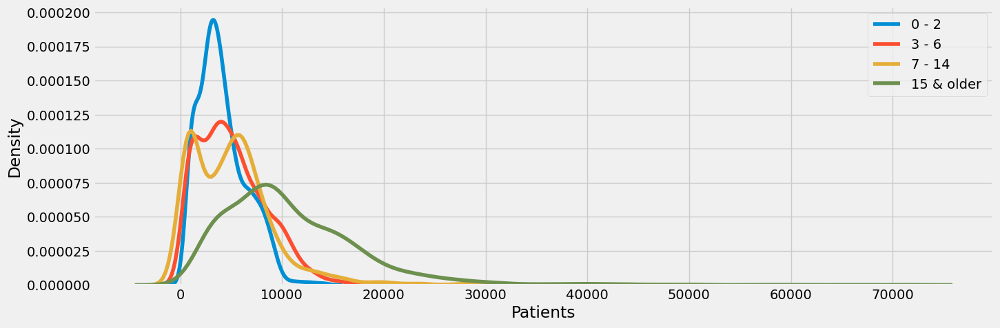

In [558]:
plt.figure(figsize=(15, 5))
sns.distplot(infections_cleared['0 - 2'], hist=False, label='0 - 2')
sns.distplot(infections_cleared['3 - 6'], hist=False, label='3 - 6')
sns.distplot(infections_cleared['7 - 14'], hist=False, label='7 - 14')
sns.distplot(infections_cleared['15 и ст.'], hist=False, label='15 & older')
plt.xlabel('Patients')
plt.legend()

In [109]:
from sklearn.model_selection import train_test_split

In [112]:
infections_cleared.iloc[round(infections_cleared.shape[0]*0.8)]

Всего       16139
0 - 2        3176
3 - 6        2811
7 - 14       1394
15 и ст.     8758
Name: 2014-08-31 00:00:00, dtype: int64

In [6]:
train = infections_cleared['Всего'].loc[infections_cleared.index < '08-31-2014']
test = infections_cleared['Всего'].loc[infections_cleared.index >= '08-31-2014']

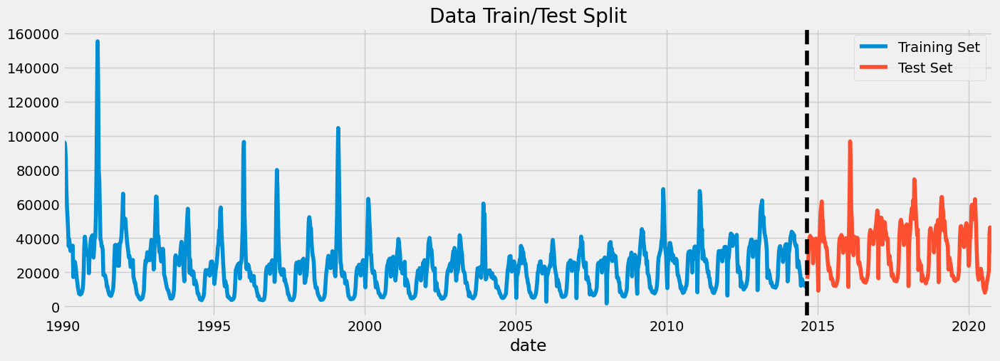

In [117]:
fig, ax = plt.subplots(figsize=(15, 5))
train.plot(ax=ax, label='Training Set', title='Data Train/Test Split')
test.plot(ax=ax, label='Test Set')
ax.axvline('08-31-2014', color='black', ls='--')
ax.legend(['Training Set', 'Test Set'])
plt.show()

# Create some other features

In [7]:
def create_features(df):
    """
    Create time series features based on time series index.
    """
    df = df.copy()
    df['quarter'] = df.index.quarter
    df['month'] = df.index.month
    df['year'] = df.index.year
    return df

infections_clear_fetured = create_features(infections_cleared)

/var/folders/_2/3r2pyzk16rdbwgbf6s6rlngr0000gn/T/ipykernel_1383/2566589114.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=infections_clear_fetured, x='month', y='Всего', palette='Blues')


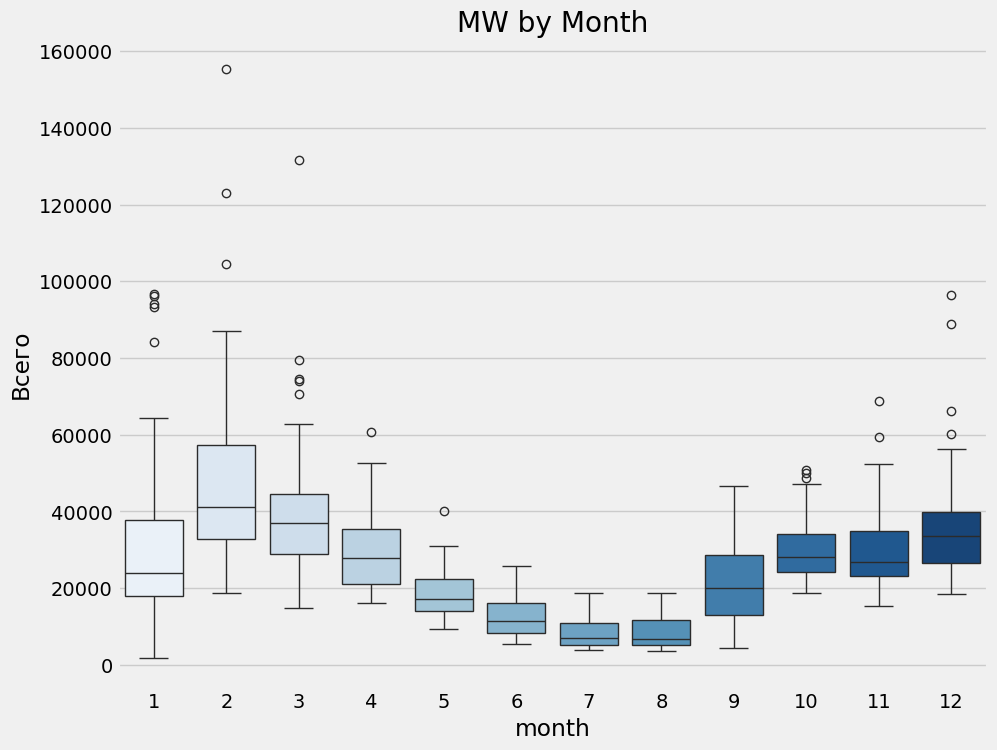

In [126]:
fig, ax = plt.subplots(figsize=(10, 8))
sns.boxplot(data=infections_clear_fetured, x='month', y='Всего', palette='Blues')
ax.set_title('MW by Month')
plt.show()

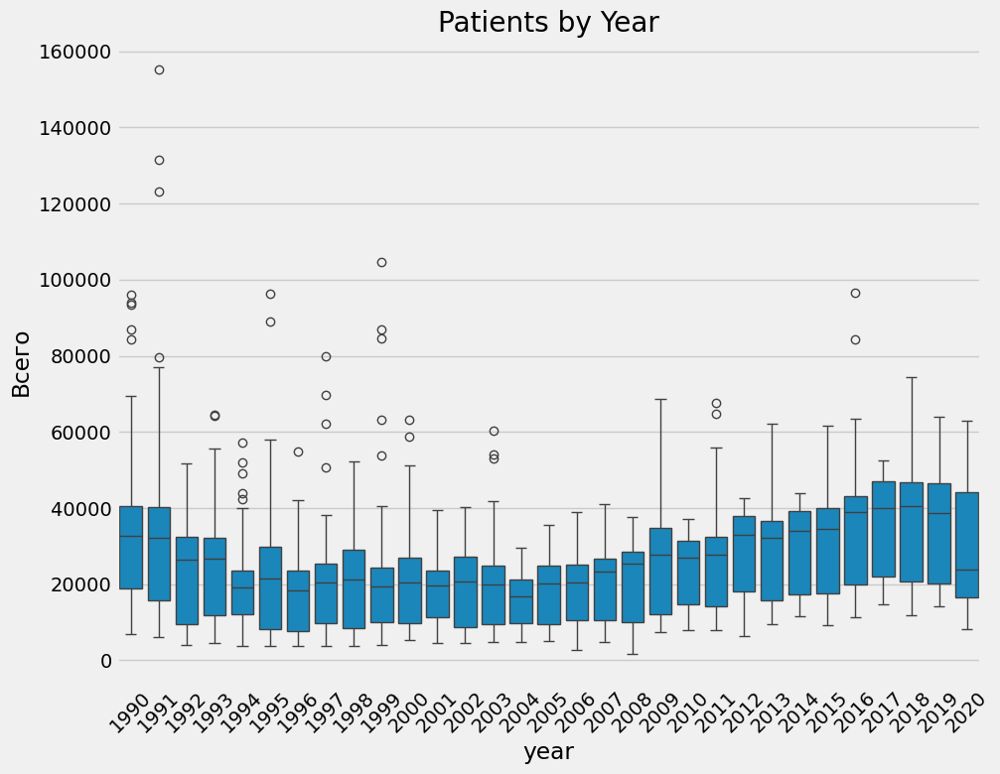

In [128]:
fig, ax = plt.subplots(figsize=(10, 8))
sns.boxplot(data=infections_clear_fetured, x='year', y='Всего')
ax.set_title('Patients by Year')
plt.xticks (rotation= 45 )
plt.show()

In [141]:
train.index.month

Index([1, 1, 1, 1, 2, 2, 2, 2, 3, 3,
       ...
       6, 6, 7, 7, 7, 7, 8, 8, 8, 8],
      dtype='int32', name='date', length=1286)

In [8]:
# train_featured = create_features(train)
# tes_featured = create_features(test)
train = infections_clear_fetured[['Всего', 'quarter', 'month', 'year']].loc[infections_clear_fetured.index < '08-31-2014']
test = infections_clear_fetured[['Всего', 'quarter', 'month', 'year']].loc[infections_clear_fetured.index >= '08-31-2014']

In [9]:
FEATURES = ['quarter', 'month', 'year']
TARGET = 'Всего'

X_train = train[FEATURES]
y_train = train[TARGET]

X_test = test[FEATURES]
y_test = test[TARGET]

In [10]:
from reservoirpy.datasets import henon_map, rossler

henon = henon_map(1000)
rossler_attractor = rossler(1000, x0=[1, 1, 0])

In [1411]:
from scipy.linalg import hankel
from itertools import combinations

def Norm01(x):
    mi=np.nanmin(x)
    ma=np.nanmax(np.array(x)-mi)
    if ma>0.:
        x_n=(np.array(x)-mi)/ma
        return x_n, mi, ma
    else:
        return np.zeros(len(x)), mi, ma
'''Восстановление'''
def Nback(x_n, mi, ma):
    return x_n*ma+mi


def DimEmb(tser, eps=.1):
    ser,_,_=Norm01(tser)
    n=len(ser)
    cn=[1]
    d0=0
    h=hankel(ser)
    for k in range(2,n//2):#
        ent=sum(cn)
        w=h[:n-k, :k]
        ro=np.zeros([n-k, n-k])
        for i,j in combinations(np.arange(n-k), 2):
            norm=np.linalg.norm(w[i]-w[j])
            ro[i,j]=norm
            ro[j,i]=norm
        cl=[]
        cn=[]
        ls=np.linspace(ro[ro!=0].min(), ro.max(), num=20)
        for l in ls:
            c=np.heaviside(l-ro-np.diag(np.ones(n-k)),1).sum()//2
            cn.append(c/(n-k)**2)
            cl.append(np.log(c/(n-k)**2))
        dc=(cl[1]-cl[0])/(np.log(ls[1])-np.log(ls[0]))
        if abs(dc-d0) > eps: # (ro.max() - ro.min())/50.:
            d0=dc
        else:
            break
    k-=1
    dc=d0
    ent=sum(cn)/ent
    return k, dc, ent #k - размерность вложения, dc - корреляционная размерность, ent - оценка энтропии.

In [1412]:
ser=infections_clear_fetured['Всего'].values
k, cint, _ = DimEmb(ser, eps=.1)
k, cint #размерность и корреляционный интеграл

(6, 3.1967974064413864)

## ARIMA & SARIMA

In [20]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
# import pmd

In [277]:
# Обучение модели ARIMA
model_arima = ARIMA(y_train, order=(1, 0, 0)) # 1,1,2
model_fitted_ARIMA = model_arima.fit()

# Вывод статистики модели
# print(model_fitted_ARIMA.summary())

/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)


In [284]:
y_train.values.reshape(-1, 1)[:5]

array([[84268],
       [93313],
       [96043],
       [94043],
       [86911]])

In [1520]:
print('\t ARIMA MODEL : In - Sample Forecasting \n')

history = [x for x in infections_cleared[:y_train.shape[0]]['Всего']]
predictions = []

for t in range(len(y_test)):

    model = ARIMA(history, order=(1,1,2))
    model_fit = model.fit()

    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(float(yhat))

    obs = y_test[t]
    history.append(obs)

    # print(f'predicted = {yhat}, expected = {obs}')

	 ARIMA MODEL : In - Sample Forecasting 



In [1522]:
predictions = pd.DataFrame(predictions, index=X_test.index)

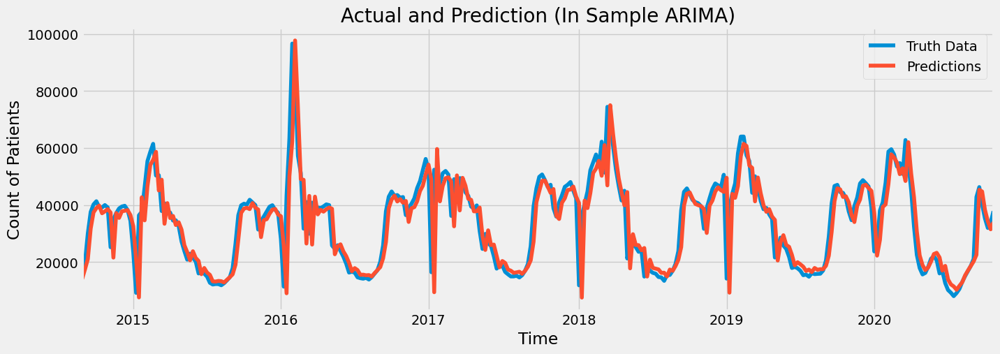

In [1523]:
# Прогноз на основе обученной модели
ax = test[['Всего']].plot(figsize=(15, 5))
predictions.plot(ax=ax)
plt.legend(['Truth Data', 'Predictions'])
ax.set_title('Actual and Prediction (In Sample ARIMA)')
plt.ylabel('Count of Patients')
plt.xlabel('Time')
plt.show()

In [1564]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
r2_arima = round(r2_score(y_test, predictions), 3)
mse_arima = round(mean_squared_error(y_test, predictions), 2)
mae_arima = round(mean_absolute_error(y_test, predictions), 2)
r2_arima

0.721

## henon * rossler arima

In [12]:
print('\t ARIMA MODEL : In - Sample Forecasting \n')

history = henon[:int(len(henon)*0.8), 0].tolist()
predictions_henon_arima = []

for t in range(len(henon) - int(len(henon)*0.8)):

    model = ARIMA(history, order=(1,1,2))
    model_fit = model.fit()

    output = model_fit.forecast()
    yhat = output[0]
    predictions_henon_arima.append(float(yhat))

    history.append(henon[t+int(len(henon)*0.8), 0])

	 ARIMA MODEL : In - Sample Forecasting 



In [1479]:
henon[3, 0]

1.076

In [1478]:
henon[:5]

array([[ 0.       ,  0.       ],
       [ 1.       ,  0.       ],
       [-0.4      ,  0.3      ],
       [ 1.076    , -0.12     ],
       [-0.7408864,  0.3228   ]])

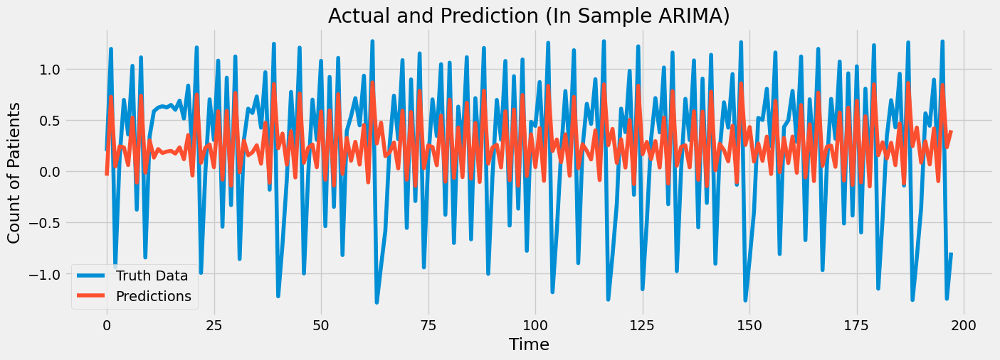

In [21]:
# Прогноз на основе обученной модели
plt.figure(figsize=(15, 5))
plt.plot(henon[int(len(henon)*0.8):-2, 0])
plt.plot(predictions_henon_arima[2:])
plt.legend(['Truth Data', 'Predictions'])
plt.title('Actual and Prediction (In Sample ARIMA)')
plt.ylabel('Count of Patients')
plt.xlabel('Time')
plt.show()

In [22]:
r2_henon_arima = round(r2_score(henon[int(len(henon)*0.8):-2, 0], predictions_henon_arima[2:]), 3)
mse_henon_arima = round(mean_squared_error(henon[int(len(henon)*0.8):-2, 0], predictions_henon_arima[2:]),2)
mae_henon_arima = round(mean_absolute_error(henon[int(len(henon)*0.8):-2, 0], predictions_henon_arima[2:]),2)
r2_henon_arima

0.372

In [23]:
print('\t ARIMA MODEL : In - Sample Forecasting \n')

history = rossler_attractor[:int(len(rossler_attractor)*0.8), 0].tolist()
predictions_rosler_arima = []

for t in range(len(rossler_attractor) - int(len(rossler_attractor)*0.8)):

    model = ARIMA(history, order=(1,1,2))
    model_fit = model.fit()

    output = model_fit.forecast()
    yhat = output[0]
    predictions_rosler_arima.append(float(yhat))

    history.append(rossler_attractor[t+int(len(rossler_attractor)*0.8), 0])

	 ARIMA MODEL : In - Sample Forecasting 



/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/

NameError: name 'ax' is not defined

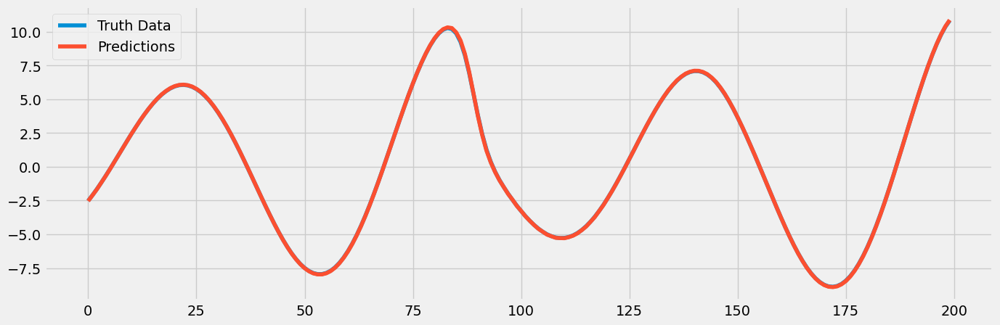

In [24]:
# Прогноз на основе обученной модели
plt.figure(figsize=(15, 5))
plt.plot(rossler_attractor[int(len(rossler_attractor)*0.8):, 0])
plt.plot(predictions_rosler_arima)
plt.legend(['Truth Data', 'Predictions'])
plt.title('Actual and Prediction (In Sample ARIMA) ROSSLER')
plt.xlabel('Time')
plt.show()

In [179]:
r2_rossler_arima = round(r2_score(rossler_attractor[int(len(rossler_attractor)*0.8):, 0], predictions_rosler_arima),3)
mse_rossler_arima = round(mean_squared_error(rossler_attractor[int(len(rossler_attractor)*0.8):, 0], predictions_rosler_arima),3)
mae_rossler_arima = round(mean_absolute_error(rossler_attractor[int(len(rossler_attractor)*0.8):, 0], predictions_rosler_arima),3)
r2_rossler_arima

1.0

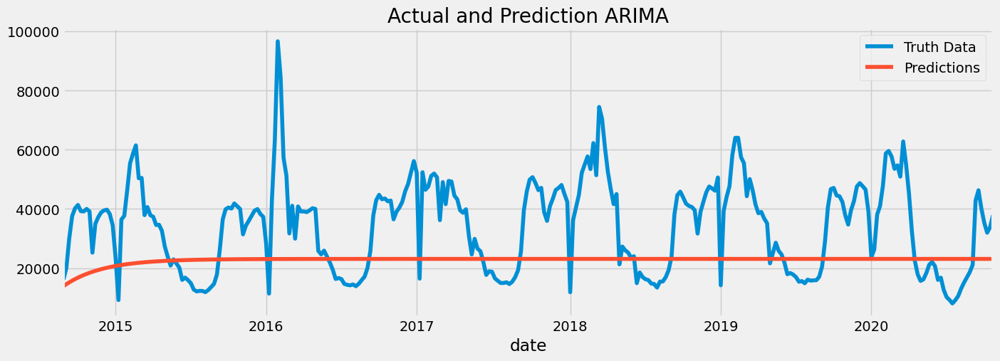

In [319]:
# Прогноз на основе обученной модели
forecast_arima = model_fitted_ARIMA.forecast(steps=y_test.shape[0])

ax = test[['Всего']].plot(figsize=(15, 5))
forecast_arima.plot(ax=ax)
plt.legend(['Truth Data', 'Predictions'])
ax.set_title('Actual and Prediction ARIMA')
plt.show()

In [247]:
# Обучение модели SARIMA
model_sarima = SARIMAX(y_train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
model_fitted_sarima = model_sarima.fit()

# Вывод статистики модели
print(model_fitted_sarima.summary())

/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-SUN will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.02055D+01    |proj g|=  6.06690D-02

At iterate    5    f=  1.01692D+01    |proj g|=  1.11819D-02

At iterate   10    f=  1.01676D+01    |proj g|=  4.86359D-04

At iterate   15    f=  1.01676D+01    |proj g|=  1.43917D-04

At iterate   20    f=  1.01675D+01    |proj g|=  4.89898D-03

At iterate   25    f=  1.01032D+01    |proj g|=  8.84268D-02

At iterate   30    f=  1.00916D+01    |proj g|=  9.18696D-03

At iterate   35    f=  1.00854D+01    |proj g|=  6.70235D-03

At iterate   40    f=  1.00851D+01    |proj g|=  8.13324D-03

At iterate   45    f=  1.00827D+01    |proj g|=  2.38357D-02

At iterate   50    f=  1.00639D+01    |proj g|=  3.96558D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [248]:
# Прогноз на основе обученной модели
forecast_sarima = model_fitted_sarima.forecast(steps=y_test.shape[0])

In [250]:
forecast_sarima.head()

2014-08-31    13365.990873
2014-09-07    12987.139173
2014-09-14    13185.894214
2014-09-21    13148.895503
2014-09-28    13021.465995
Freq: W-SUN, Name: predicted_mean, dtype: float64

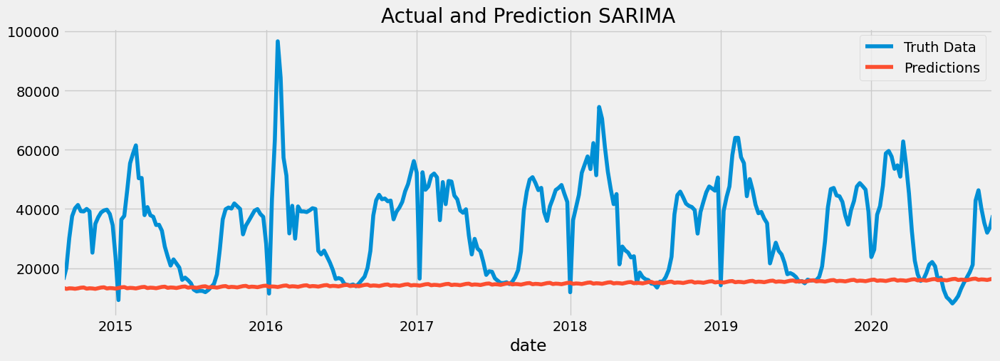

In [306]:
ax = test[['Всего']].plot(figsize=(15, 5))
forecast_sarima.plot(ax=ax)
plt.legend(['Truth Data', 'Predictions'])
ax.set_title('Actual and Prediction SARIMA')
plt.show()

In [155]:
print('\t SARIMAX MODEL : In - Sample Forecasting \n')

history = [x for x in infections_cleared[:y_train.shape[0]]['Всего']]
predictions_sarima = []

for t in range(len(y_test)):

    model_sarima = SARIMAX(history, order=(1, 1, 1), seasonal_order=(1, 1, 1, 7), enforce_stationarity=False)
    model_fitted_sarima = model_sarima.fit(disp=False)

    output = model_fitted_sarima.forecast()
    yhat = output[0]
    predictions_sarima.append(float(yhat))

    history.append(y_test[t])

	 SARIMAX MODEL : In - Sample Forecasting 



/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/roman14/.

In [156]:
predictions_sarima = pd.DataFrame(predictions_sarima, index=X_test.index)

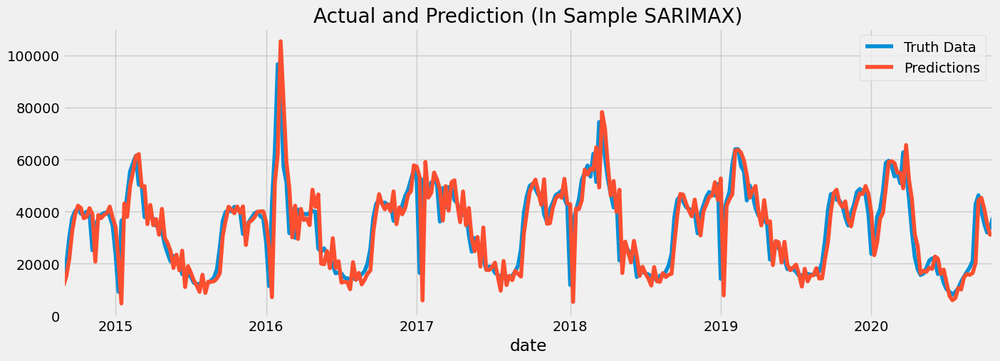

In [942]:
# Прогноз на основе обученной модели
ax = test[['Всего']].plot(figsize=(15, 5))
predictions_sarima.plot(ax=ax)
plt.legend(['Truth Data', 'Predictions'])
ax.set_title('Actual and Prediction (In Sample SARIMAX)')
plt.show()

In [159]:
r2_sarima = round(r2_score(y_test, predictions_sarima), 3)
mse_sarima = round(mean_squared_error(y_test, predictions_sarima), 2)
mae_sarima = round(mean_absolute_error(y_test, predictions_sarima), 2)
r2_sarima, mse_sarima, mae_sarima

(0.661, 77007512.88, 5580.52)

#### Henon * Rossler ARIMA/SARIMA

In [25]:
print('\t SARIMAX MODEL : In - Sample Forecasting \n')

history = henon[:int(len(henon)*0.8), 0].tolist()
predictions_sarima_henon = []

for t in range(len(henon) - int(len(henon)*0.8)):

    model_sarima = SARIMAX(history, order=(1, 1, 1), seasonal_order=(1, 1, 1, 7), enforce_stationarity=False)
    model_fitted_sarima = model_sarima.fit(disp=False)

    output = model_fitted_sarima.forecast()
    yhat = output[0]
    predictions_sarima_henon.append(float(yhat))

    history.append(henon[t+int(len(henon)*0.8), 0])

	 SARIMAX MODEL : In - Sample Forecasting 



/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


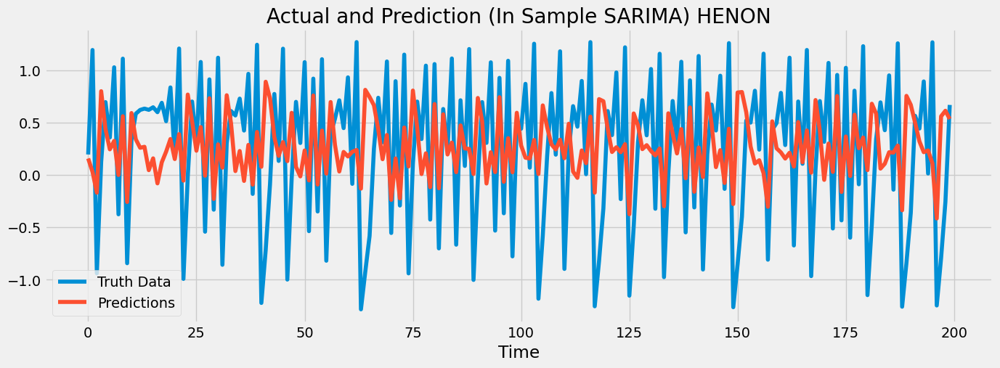

In [26]:
# Прогноз на основе обученной модели
plt.figure(figsize=(15, 5))
plt.plot(henon[int(len(henon)*0.8):, 0])
plt.plot(predictions_sarima_henon)
plt.legend(['Truth Data', 'Predictions'])
plt.title('Actual and Prediction (In Sample SARIMA) HENON')
plt.xlabel('Time')
plt.show()

In [161]:
r2_henon_sarima = round(r2_score(henon[int(len(henon)*0.8):, 0], predictions_sarima_henon),3)
mse_henon_sarima = round(mean_squared_error(henon[int(len(henon)*0.8):, 0], predictions_sarima_henon), 2)
mae_henon_sarima = round(mean_absolute_error(henon[int(len(henon)*0.8):, 0], predictions_sarima_henon), 2)
r2_henon_sarima, mse_henon_sarima, mae_henon_sarima

(0.102, 0.47, 0.57)

In [28]:
history = rossler_attractor[:int(len(rossler_attractor)*0.8), 0].tolist()
predictions_rosler_sarima = []

for t in range(len(rossler_attractor) - int(len(rossler_attractor)*0.8)):

    model_sarima = SARIMAX(history, order=(1, 1, 1), seasonal_order=(1, 1, 1, 7), enforce_stationarity=False)
    model_fitted_sarima = model_sarima.fit(disp=False)

    output = model_fitted_sarima.forecast()
    yhat = output[0]
    predictions_rosler_sarima.append(float(yhat))

    history.append(rossler_attractor[t+int(len(rossler_attractor)*0.8), 0])

/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization fai

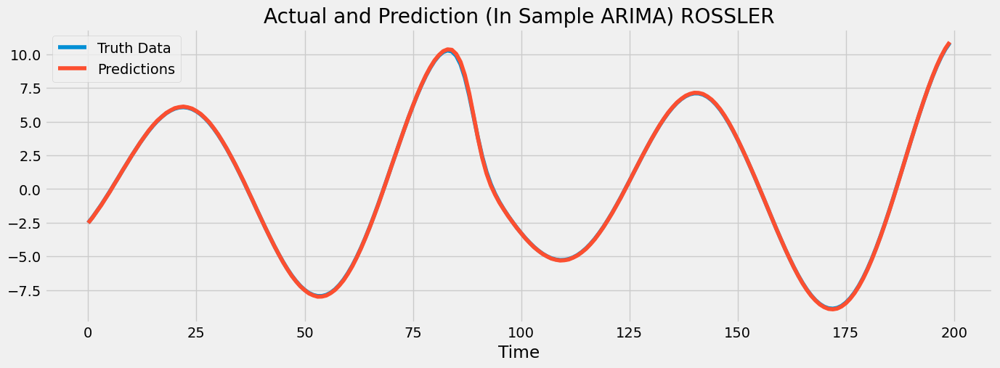

In [29]:
# Прогноз на основе обученной модели
plt.figure(figsize=(15, 5))
plt.plot(rossler_attractor[int(len(rossler_attractor)*0.8):, 0])
plt.plot(predictions_rosler_sarima)
plt.legend(['Truth Data', 'Predictions'])
plt.title('Actual and Prediction (In Sample ARIMA) ROSSLER')
plt.xlabel('Time')
plt.show()

In [177]:
r2_rossler_sarima = round(r2_score(rossler_attractor[int(len(rossler_attractor)*0.8):, 0], predictions_rosler_sarima),3)
mse_rossler_sarima = round(mean_squared_error(rossler_attractor[int(len(rossler_attractor)*0.8):, 0], predictions_rosler_sarima), 2)
mae_rossler_sarima = round(mean_absolute_error(rossler_attractor[int(len(rossler_attractor)*0.8):, 0], predictions_rosler_sarima), 2)
r2_rossler_sarima, mse_rossler_sarima, mae_rossler_sarima

(1.0, 0.0, 0.03)

## Prophet

In [216]:
from prophet import Prophet

In [68]:
scaler = MinMaxScaler()

In [1330]:
prophet_model = Prophet(interval_width=0.95)
prophet_model_henon = Prophet(interval_width=0.95)
prophet_model_rossler = Prophet(interval_width=0.95)

In [696]:
y_train_prop = y_train.copy()
y_train_prop = y_train_prop.reset_index()
y_train_prop.rename(columns = {'Всего':'y', 'date':'ds'}, inplace = True)
# y_train_prop['y'] = scaler.fit_transform(y_train_prop['y'].to_numpy().reshape(-1, 1))

In [35]:
df_henon = pd.DataFrame({'ds': pd.date_range(start='1/1/2018', periods=henon.shape[0]), 'y': henon[:, 1]})

df_rossler = pd.DataFrame({'ds': pd.date_range(start='1/1/2018', periods=rossler_attractor.shape[0]), 'y': rossler_attractor[:, 1]})

In [36]:
henon_train = int(df_henon.shape[0]*0.8)
rossler_train = int(df_rossler.shape[0]*0.8)

In [1232]:
df_rossler.head()

,ds,y
0,2018-01-01,1.000000
1,2018-01-02,0.893161
2,2018-01-03,0.773889
3,2018-01-04,0.643667
4,2018-01-05,0.503932


In [219]:
y_train_prop.head()

,ds,y
0,1990-01-07,84268
1,1990-01-14,93313
2,1990-01-21,96043
3,1990-01-28,94043
4,1990-02-04,86911


In [220]:
y_train_prop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1286 entries, 0 to 1285
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      1286 non-null   datetime64[ns]
 1   y       1286 non-null   int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 20.2 KB


In [1331]:
prophet_model.fit(y_train_prop)
prophet_model_henon.fit(df_henon[:henon_train])
prophet_model_rossler.fit(df_rossler[:rossler_train])

15:09:50 - cmdstanpy - INFO - Chain [1] start processing
15:09:51 - cmdstanpy - INFO - Chain [1] done processing
15:09:51 - cmdstanpy - INFO - Chain [1] start processing
15:09:51 - cmdstanpy - INFO - Chain [1] done processing
15:09:51 - cmdstanpy - INFO - Chain [1] start processing
15:09:51 - cmdstanpy - INFO - Chain [1] done processing


In [1332]:
future_dates = prophet_model.make_future_dataframe(periods=y_test.shape[0], freq='W')
future_henon = prophet_model_henon.make_future_dataframe(periods=df_henon.shape[0] - henon_train, freq='D')
future_rossler = prophet_model_rossler.make_future_dataframe(periods=df_rossler.shape[0] - rossler_train, freq='D')
future_dates.tail()

,ds
1603,2020-09-27
1604,2020-10-04
1605,2020-10-11
1606,2020-10-18
1607,2020-10-25


In [1333]:
forecast = prophet_model.predict(future_dates)
forecast_henon = prophet_model.predict(future_henon)
forecast_rossler = prophet_model.predict(future_rossler)

forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1603,2020-09-27,40896.123704,22901.988956,58119.760542
1604,2020-10-04,42030.451245,23565.468105,60585.449154
1605,2020-10-11,42181.174822,23991.309470,61171.930957
1606,2020-10-18,42334.736582,22580.164987,60414.215261
1607,2020-10-25,42386.457550,24513.752122,60707.617565


In [1238]:
df_henon.head()

,ds,y
0,2018-01-01,0.000000
1,2018-01-02,1.000000
2,2018-01-03,-0.400000
3,2018-01-04,1.076000
4,2018-01-05,-0.740886


In [1334]:
forecast_rossler[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2018-01-01,37358.651543,20285.706296,55686.321741
1,2018-01-02,36831.828081,19389.228424,54013.080890
2,2018-01-03,36349.920628,18717.387405,55781.073527
3,2018-01-04,35919.882647,18410.933456,54203.821232
4,2018-01-05,35548.211606,17401.904898,52023.759977


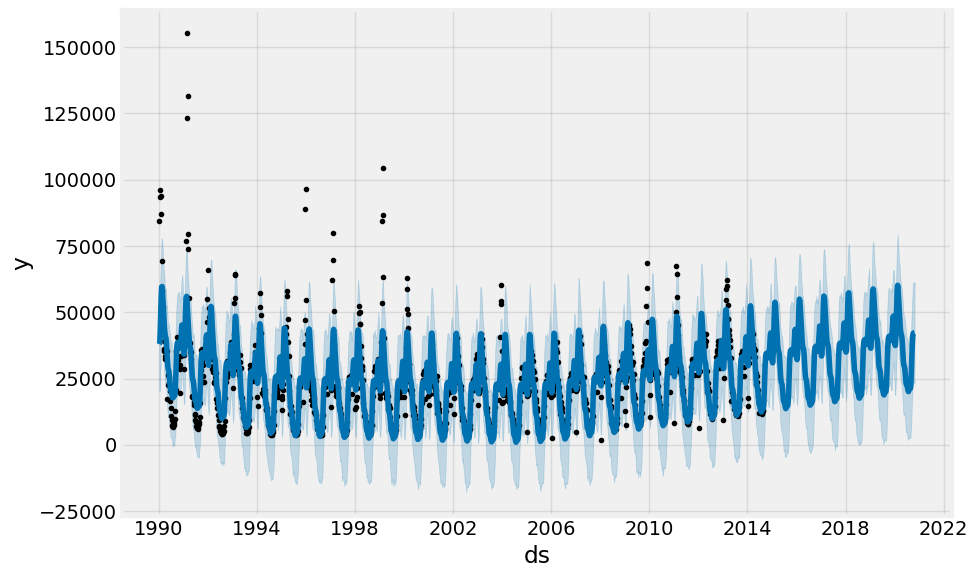

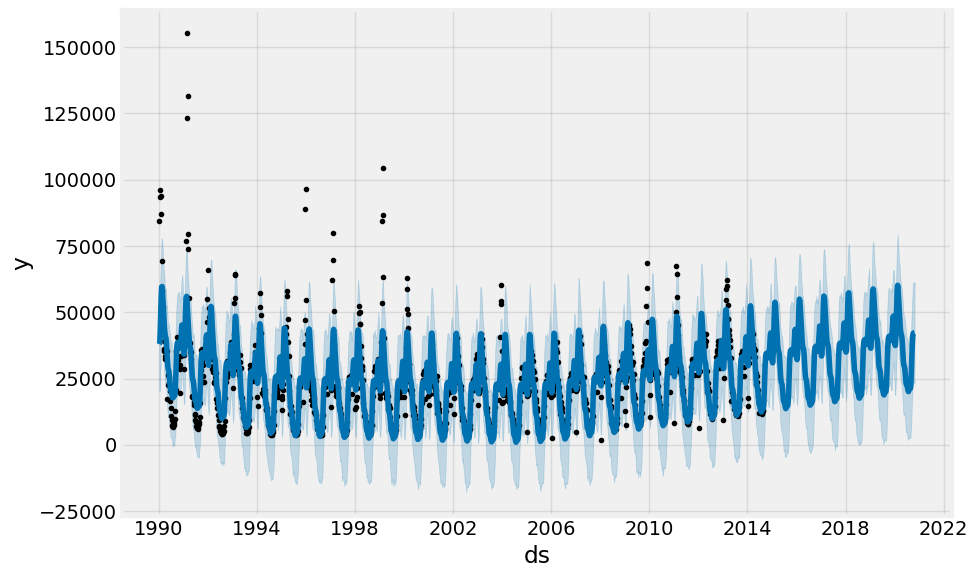

In [700]:
prophet_model.plot(forecast, uncertainty=True)

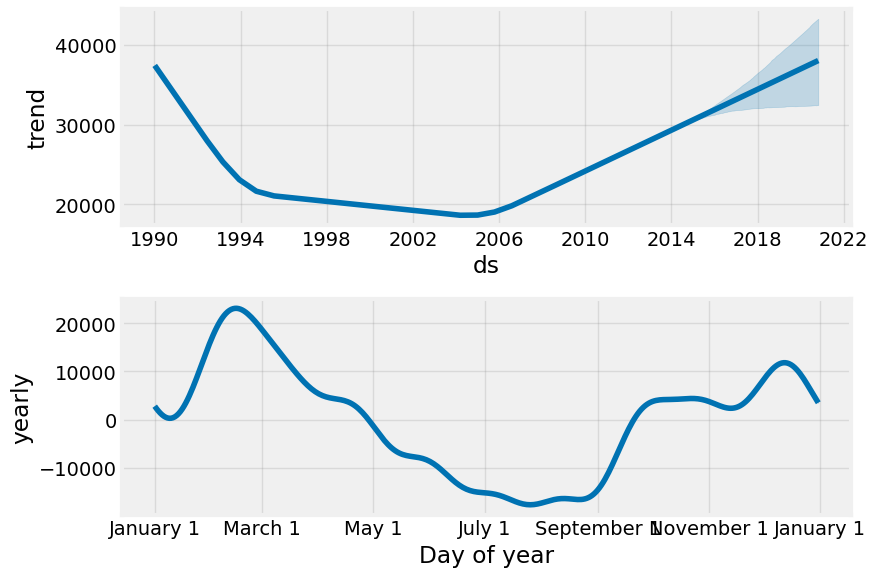

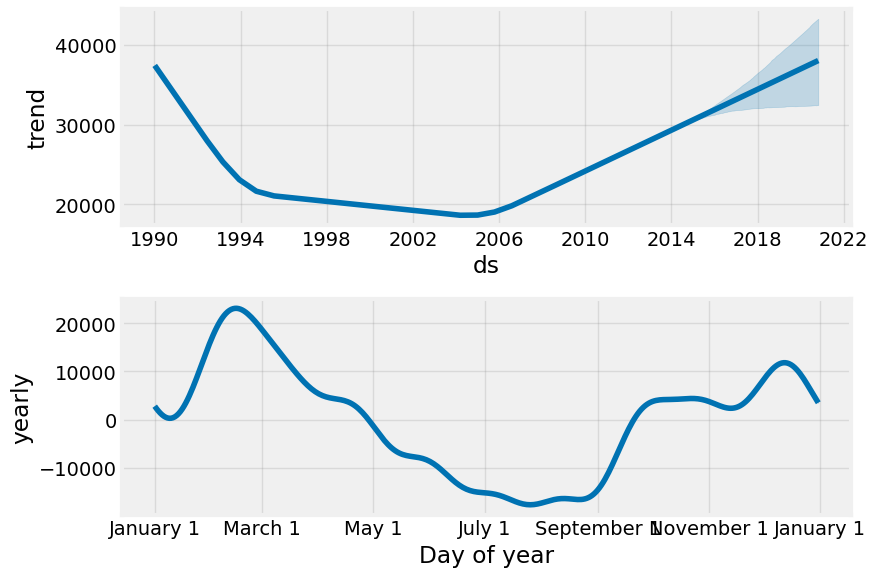

In [236]:
prophet_model.plot_components(forecast)

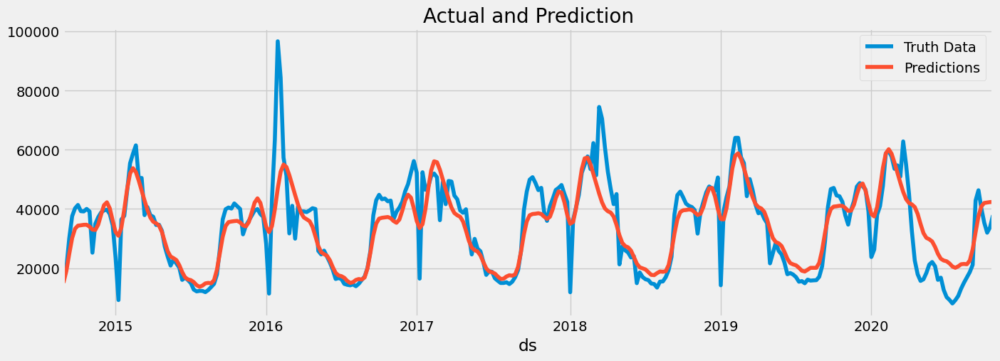

In [1335]:
ax = test[['Всего']].plot(figsize=(15, 5))
# ax = pd.DataFrame(scaler.transform(y_test.to_numpy().reshape(-1, 1)), index=y_test.index).plot(figsize=(15, 5))
forecast.set_index('ds')[y_train.shape[0]:]['yhat'].plot(ax=ax)
plt.legend(['Truth Data', 'Predictions'])
ax.set_title('Actual and Prediction')
plt.show()

In [1571]:
r2_prop = round(r2_score(y_test, forecast[y_train.shape[0]:]['yhat']),3)
mse_prop = round(mean_squared_error(y_test, forecast[y_train.shape[0]:]['yhat']),2)
mae_prop = round(mean_absolute_error(y_test, forecast[y_train.shape[0]:]['yhat']),2)
r2_prop
# r2_score(scaler.transform(y_test.to_numpy().reshape(-1, 1)), forecast[y_train.shape[0]:]['yhat'].to_numpy().reshape(-1,1))

0.74

In [1244]:
df_henon.describe()

,ds,y
count,1000,1000.000000
mean,2019-05-15 12:00:00,0.253974
min,2018-01-01 00:00:00,-1.283272
25%,2018-09-07 18:00:00,-0.336799
50%,2019-05-15 12:00:00,0.406171
75%,2020-01-20 06:00:00,0.856926
max,2020-09-26 00:00:00,1.271689
std,NaN,0.723162


In [1337]:
from sklearn.preprocessing import minmax_scale

Text(0.5, 1.0, 'Henon Map Predictions')

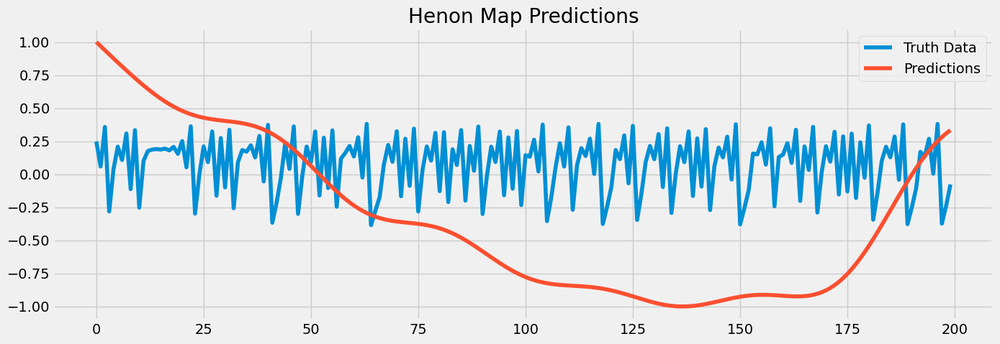

In [1338]:
plt.figure(figsize=(15,5))
plt.plot(df_henon[henon_train:]['y'].to_numpy())
plt.plot(minmax_scale(forecast_henon[henon_train:]['yhat'].to_numpy().reshape(-1,1), feature_range=(-1, 1)))
plt.legend(['Truth Data', 'Predictions'])
plt.title('Henon Map Predictions')

Text(0.5, 1.0, 'Rossler Attractor Predictions')

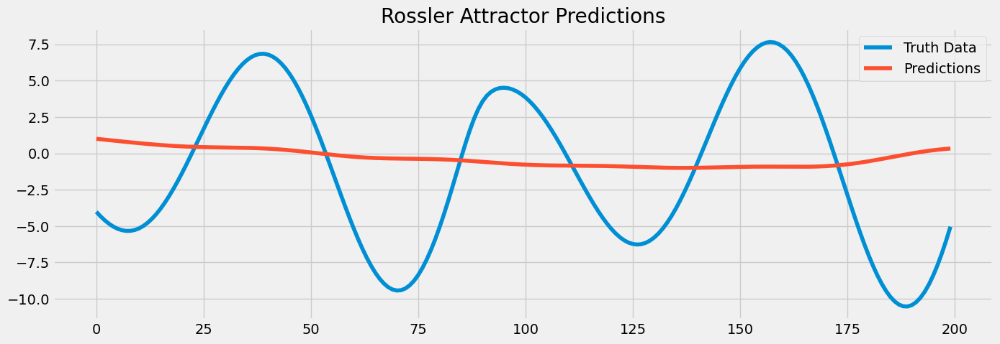

In [1339]:
plt.figure(figsize=(15,5))
plt.plot(df_rossler[rossler_train:]['y'].to_numpy())
plt.plot(minmax_scale(forecast_rossler[rossler_train:]['yhat'].to_numpy().reshape(-1,1), feature_range=(-1, 1)))
plt.legend(['Truth Data', 'Predictions'])
plt.title('Rossler Attractor Predictions')

## Ensemble method

In [31]:
import xgboost as xgb
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import StackingRegressor

In [32]:
estimators = [('xgb', xgb.XGBRegressor(base_score=0.5, booster='gbtree',
                       n_estimators=1000,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)),
              ('rf', RandomForestRegressor(n_estimators=10, max_depth=None,
                                           min_samples_split=2, random_state=23))]

final_estimator = GradientBoostingRegressor(n_estimators=25, subsample=0.5, min_samples_leaf=25, max_features=1,
    random_state=23)

stack = StackingRegressor(
    estimators=estimators,
    final_estimator=final_estimator)

In [162]:
stack.fit(X_train, MinMaxScaler.fit_transform(y_train))

/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning: [01:45:44] WARNING: /var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_b6b50u1t0e/croot/xgboost-split_1713972723244/work/cpp_src/src/objective/regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserWarning)
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning: [01:45:45] WARNING: /var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_b6b50u1t0e/croot/xgboost-split_1713972723244/work/cpp_src/src/objective/regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserWarning)
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning: [01:45:46] WARNING: /var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_b6b50u1t0e/croot/xgboost-split_1713972723244/work/cpp_src/src/objective/regression_obj.cu:209: reg:linear is 

StackingRegressor(estimators=[('xgb',
                               XGBRegressor(base_score=0.5, booster='gbtree',
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning...
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=1000, n_jobs=None,
                                            num_parallel_tree=None,
                                            objective='reg:linear', ...)),
                              ('rf',
                               RandomForestRegressor(n_estimators=10,
                                                     random_state=23))],
                  final_estimator=GradientBoostingRegressor(max_features=1,
                                                            min_samples_leaf=25,
                                                            n_estimators=25,
                                                            random_state=23,
                                                            subsample=0.5))

In [185]:
stack_pred = pd.DataFrame(stack.predict(X_test), index=X_test.index)

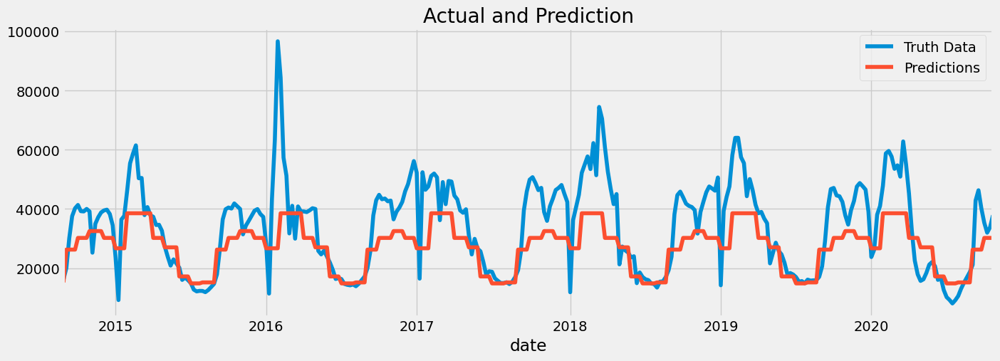

In [192]:
ax = test[['Всего']].plot(figsize=(15, 5))
stack_pred.plot(ax=ax)
plt.legend(['Truth Data', 'Predictions'])
ax.set_title('Actual and Prediction')
plt.show()

In [193]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [1594]:
r2_stack = round(r2_score(y_test, stack_pred),3)
mse_stack = round(mean_squared_error(y_test, stack_pred),2)
mae_stack = round(mean_absolute_error(y_test, stack_pred),2)
r2_stack

0.34

In [37]:
stack.fit(henon[:henon_train, 0].reshape(-1,1), henon[1:henon_train+1, 0].reshape(-1,1))

/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/sklearn/ensemble/_stacking.py:955: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning: [06:25:22] WARNING: /var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_b6b50u1t0e/croot/xgboost-split_1713972723244/work/cpp_src/src/objective/regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserWarning)
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning: [06:25:23] WARNING: /var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_b6b50u1t0e/croot/xgboost-split_1713972723244/work/cpp_src/src/objective/regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserW

StackingRegressor(estimators=[('xgb',
                               XGBRegressor(base_score=0.5, booster='gbtree',
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning...
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=1000, n_jobs=None,
                                            num_parallel_tree=None,
                                            objective='reg:linear', ...)),
                              ('rf',
                               RandomForestRegressor(n_estimators=10,
                                                     random_state=23))],
                  final_estimator=GradientBoostingRegressor(max_features=1,
                                                            min_samples_leaf=25,
                                                            n_estimators=25,
                                                            random_state=23,
                                                            subsample=0.5))

In [38]:
stack_pred_henon = stack.predict(henon[henon_train:, 0].reshape(-1,1))

Text(0.5, 1.0, 'Henon Map Stacking Predictions')

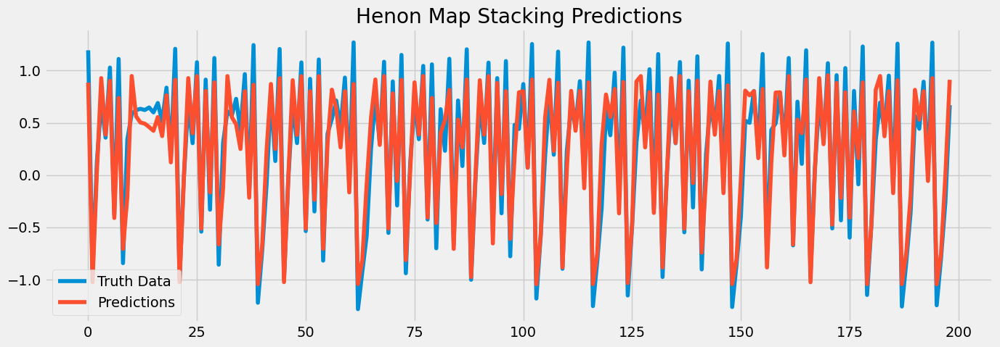

In [39]:
plt.figure(figsize=(15,5))
plt.plot(henon[henon_train+1:, 0])
plt.plot(stack_pred_henon[:-1])
plt.legend(['Truth Data', 'Predictions'])
plt.title('Henon Map Stacking Predictions')

In [40]:
r2_stack_henon = round(r2_score(henon[henon_train+1:, 0], stack_pred_henon[:-1]),3)
mse_stack_henon = round(mean_squared_error(henon[henon_train+1:, 0], stack_pred_henon[:-1]),2)
mae_stack_henon = round(mean_absolute_error(henon[henon_train+1:, 0], stack_pred_henon[:-1]),2)
r2_stack_henon

0.917

In [41]:
# stack.fit(df_rossler.reset_index()[:rossler_train]['index'].to_numpy().reshape(-1,1)
#           ,df_rossler[:rossler_train]['y'].to_numpy().reshape(-1,1))

# stack.fit(rossler_attractor[:rossler_train, 1:].reshape(-1,2)
#           ,df_rossler[:rossler_train]['y'].to_numpy().reshape(-1,1))
stack.fit(rossler_attractor[:rossler_train, 0].reshape(-1,1),
          rossler_attractor[1:rossler_train+1, 0].reshape(-1,1))

/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/sklearn/ensemble/_stacking.py:955: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning: [06:25:29] WARNING: /var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_b6b50u1t0e/croot/xgboost-split_1713972723244/work/cpp_src/src/objective/regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserWarning)
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning: [06:25:30] WARNING: /var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_b6b50u1t0e/croot/xgboost-split_1713972723244/work/cpp_src/src/objective/regression_obj.cu:209: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserW

StackingRegressor(estimators=[('xgb',
                               XGBRegressor(base_score=0.5, booster='gbtree',
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning...
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=1000, n_jobs=None,
                                            num_parallel_tree=None,
                                            objective='reg:linear', ...)),
                              ('rf',
                               RandomForestRegressor(n_estimators=10,
                                                     random_state=23))],
                  final_estimator=GradientBoostingRegressor(max_features=1,
                                                            min_samples_leaf=25,
                                                            n_estimators=25,
                                                            random_state=23,
                                                            subsample=0.5))

In [42]:
# stack_pred_rossler = stack.predict(df_rossler.reset_index()[rossler_train:]['index'].to_numpy().reshape(-1,1))
stack_pred_rossler = stack.predict(rossler_attractor[rossler_train:, 0].reshape(-1,1))

Text(0.5, 1.0, 'Actual and Prediction')

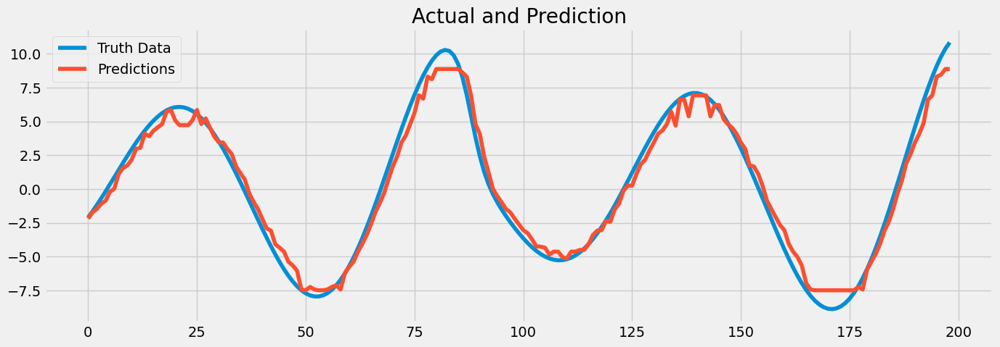

In [43]:
plt.figure(figsize=(15,5))
plt.plot(rossler_attractor[rossler_train+1:, 0])
plt.plot(stack_pred_rossler[:-1])
plt.legend(['Truth Data', 'Predictions'])
plt.title('Actual and Prediction')

In [44]:
# r2_score(rossler_attractor[rossler_train:, 0], stack_pred_rossler)
r2_stack_rossler = round(r2_score(rossler_attractor[rossler_train+1:, 0], stack_pred_rossler[:-1]),3)
mse_stack_rossler = round(mean_squared_error(rossler_attractor[rossler_train+1:, 0], stack_pred_rossler[:-1]),2)
mae_stack_rossler = round(mean_absolute_error(rossler_attractor[rossler_train+1:, 0], stack_pred_rossler[:-1]),2)
r2_stack_rossler

0.977

## LSTM

In [46]:
lstm_flu = pd.read_csv('LSTM_GRU_FLU.csv')
lstm_henon = pd.read_csv('LSTM_GRU_Henon.csv')
lstm_rossler = pd.read_csv('LSTM_GRU_Rossler.csv')

In [1600]:
r2_lstm = round(r2_score(infections_clear_fetured[train.shape[0]-2:-7]['Всего'], lstm_flu['LSTM']),3)
mse_lstm = round(mean_squared_error(infections_clear_fetured[train.shape[0]-2:-7]['Всего'], lstm_flu['LSTM']),2)
mae_lstm = round(mean_absolute_error(infections_clear_fetured[train.shape[0]-2:-7]['Всего'], lstm_flu['LSTM']),2)

r2_gru = round(r2_score(infections_clear_fetured[train.shape[0]-2:-7]['Всего'], lstm_flu['GRU']),3)
mse_gru = round(mean_squared_error(infections_clear_fetured[train.shape[0]-2:-7]['Всего'], lstm_flu['GRU']),2)
mae_gru = round(mean_absolute_error(infections_clear_fetured[train.shape[0]-2:-7]['Всего'], lstm_flu['GRU']),2)

In [49]:
r2_henon_lstm = round(r2_score(henon[henon_train:-2, 0], lstm_henon['LSTM']),3)
mse_henon_lstm = round(mean_squared_error(henon[henon_train:-2, 0], lstm_henon['LSTM']),2)
mae_henon_lstm = round(mean_absolute_error(henon[henon_train:-2, 0], lstm_henon['LSTM']),2)

r2_henon_gru = round(r2_score(henon[henon_train:-2, 0], lstm_henon['GRU']),3)
mse_henon_gru = round(mean_squared_error(henon[henon_train:-2, 0], lstm_henon['GRU']),2)
mae_henon_gru = round(mean_absolute_error(henon[henon_train:-2, 0], lstm_henon['GRU']),2)

In [50]:
r2_rossler_lstm = round(r2_score(rossler_attractor[rossler_train:-2, 0], lstm_rossler['LSTM']),3)
mse__rossler_lstm = round(mean_squared_error(rossler_attractor[rossler_train:-2, 0], lstm_rossler['LSTM']),2)
mae_rossler_lstm = round(mean_absolute_error(rossler_attractor[rossler_train:-2, 0], lstm_rossler['LSTM']),2)

r2_rossler_gru = round(r2_score(rossler_attractor[rossler_train:-2, 0], lstm_rossler['GRU']),3)
mse_rossler_gru = round(mean_squared_error(rossler_attractor[rossler_train:-2, 0], lstm_rossler['GRU']),2)
mae_rossler_gru = round(mean_absolute_error(rossler_attractor[rossler_train:-2, 0], lstm_rossler['GRU']),2)

## GRU

## ESN

In [ ]:
# def scale(array):
#     array_scaled = 2 * (array - array.min()) / (array.max() - array.min()) - 1
#     return array_scaled

In [ ]:
# X_train = y1[:300].reshape(-1, 1)
# Y_train = y1[50:350].reshape(-1, 1)
#
# X_test = y1[300:-50].reshape(-1, 1)
# Y_test = y1[350:].reshape(-1, 1)

In [69]:
X_train_esn = scaler.fit_transform(infections_cleared[:y_train.shape[0]]['Всего'].to_numpy().reshape(-1, 1))
y_train_esn = scaler.transform(infections_cleared[1:y_train.shape[0]+1]['Всего'].to_numpy().reshape(-1, 1))

X_test_esn = scaler.transform(infections_cleared[y_train.shape[0]:]['Всего'].to_numpy().reshape(-1, 1))
y_test_esn = scaler.transform(infections_cleared[y_train.shape[0]:]['Всего'].to_numpy().reshape(-1, 1))

In [63]:
X_train_esn_henon = henon[:henon_train, 0].reshape(-1,1)
y_train_esn_henon = henon[1:henon_train+1, 0].reshape(-1,1)

X_test_esn_henon = henon[henon_train:, 0].reshape(-1,1)
y_test_esn_henon = henon[henon_train+1:, 0].reshape(-1,1)

In [64]:
X_train_esn_rossler = rossler_attractor[:rossler_train, 0].reshape(-1,1)
y_train_esn_rossler = rossler_attractor[1:rossler_train+1, 0].reshape(-1,1)

X_test_esn_rossler = rossler_attractor[rossler_train:, 0].reshape(-1,1)
y_test_esn_rossler = rossler_attractor[rossler_train+1:, 0].reshape(-1,1)

In [1538]:
X_train_esn[:5]

array([[0.53736727],
       [0.59625514],
       [0.61402892],
       [0.60100783],
       [0.55457463]])

In [1023]:
# infections_cleared[y_train.shape[0]-102:].head()

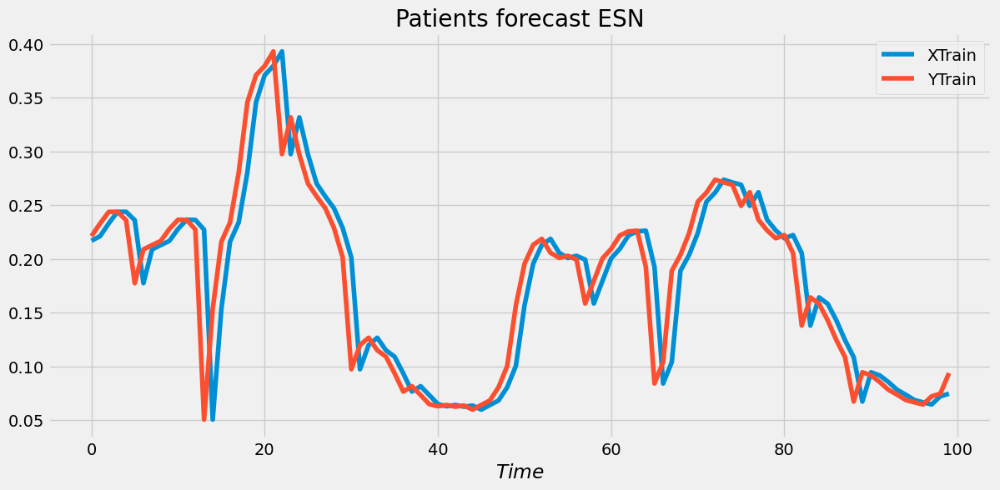

In [1442]:
plt.figure(figsize=(13, 6))
plt.title("Patients forecast ESN")
plt.xlabel("$Time$")
plt.plot(X_train_esn[-100:], label="XTrain")
plt.plot(y_train_esn[-100:], label="YTrain")
plt.legend()

In [1091]:
# X_train_esn = scale(X_train_esn)
# y_train_esn = scale(y_train_esn)
#
# X_test_esn = scale(X_test_esn)
# y_test_esn = scale(y_test_esn)

In [981]:
X_train_esn.shape

(1236, 1)

In [53]:
from reservoirpy.nodes import Reservoir, Ridge

reservoir_esn = Reservoir(100, lr=0.5, sr=0.9, regularization = 1e-8)
readout_esn = Ridge(ridge=1e-7)

esn_model = reservoir_esn >> readout_esn

In [168]:
esn_model = esn_model.fit(X_train_esn, y_train_esn, warmup = 100)
# esn_model_henon = esn_model.fit(X_train_esn_henon, y_train_esn_henon)
# esn_model_rossler = esn_model.fit(X_train_esn_rossler, y_train_esn_rossler)

Running Model-0:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-0: 1286it [00:00, 12053.84it/s]         
Running Model-0: 100%|██████████| 1/1 [00:00<00:00,  6.52it/s]


Fitting node Ridge-0...


In [169]:
esn_preds = esn_model.run(X_test_esn)
esn_preds_henon = esn_model_henon.run(X_test_esn_henon)
esn_preds_rossler = esn_model_rossler.run(X_test_esn_rossler)

Running Model-0: 322it [00:00, 10643.85it/s]          


In [782]:
esn_preds.shape

(322, 1)

In [783]:
y_test_esn.shape

(322, 1)

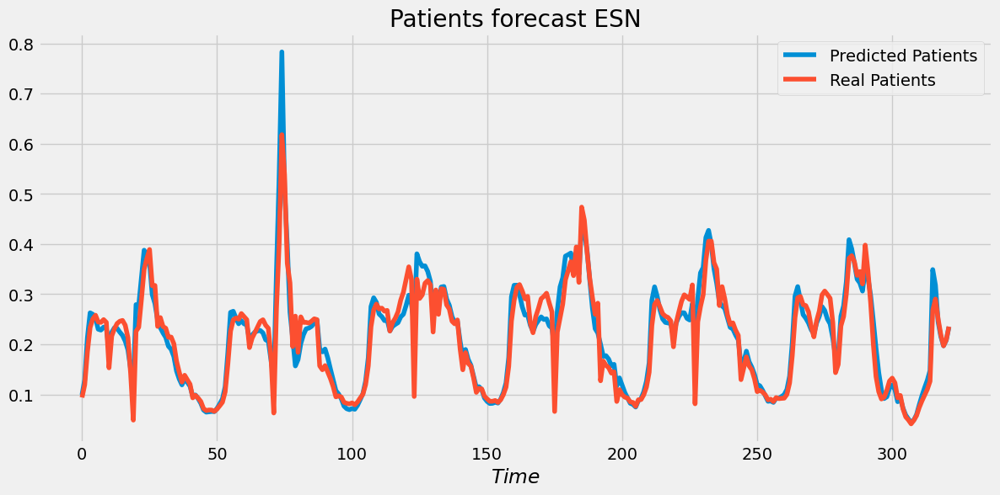

In [174]:
plt.figure(figsize=(13, 6))
plt.title("Patients forecast ESN")
plt.xlabel("$Time$")
plt.plot(esn_preds, label="Predicted Patients")
plt.plot(y_test_esn, label="Real Patients")
plt.legend()

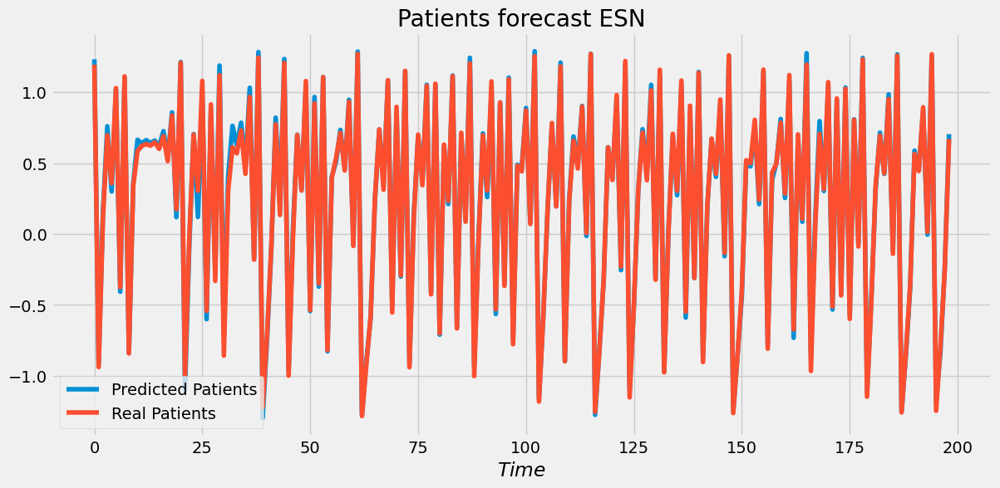

In [105]:
plt.figure(figsize=(13, 6))
plt.title("Patients forecast ESN")
plt.xlabel("$Time$")
plt.plot(esn_preds_henon[:-1], label="Predicted Patients")
plt.plot(henon[henon_train+1:, 0], label="Real Patients")
plt.legend()

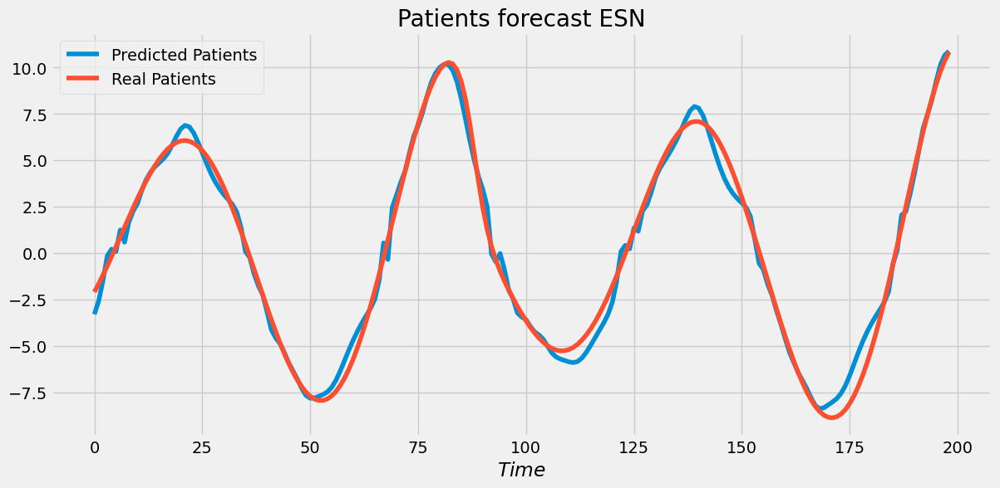

In [109]:
plt.figure(figsize=(13, 6))
plt.title("Patients forecast ESN")
plt.xlabel("$Time$")
plt.plot(esn_preds_rossler[:-1], label="Predicted Patients")
plt.plot(rossler_attractor[rossler_train+1:, 0], label="Real Patients")
plt.legend()

In [173]:
r2_esn = round(r2_score(y_test_esn, esn_preds), 3)
mse_esn = round(mean_squared_error(y_test_esn, esn_preds), 2)
mae_esn = round(mean_absolute_error(y_test_esn, esn_preds), 2)
r2_esn, mse_esn, mae_esn

(0.9, 0.0, 0.02)

In [106]:
r2_esn_henon = round(r2_score(henon[henon_train+1:, 0], esn_preds_henon[:-1]), 3)
mse_esn_henon = round(mean_squared_error(henon[henon_train+1:, 0], esn_preds_henon[:-1]), 2)
mae_esn_henon = round(mean_absolute_error(henon[henon_train+1:, 0], esn_preds_henon[:-1]), 2)
r2_esn_henon

0.997

In [110]:
r2_esn_rossler = round(r2_score(rossler_attractor[rossler_train+1:, 0], esn_preds_rossler[:-1]), 3)
mse_esn_rossler = round(mean_squared_error(rossler_attractor[rossler_train+1:, 0], esn_preds_rossler[:-1]), 2)
mae_esn_rossler = round(mean_absolute_error(rossler_attractor[rossler_train+1:, 0], esn_preds_rossler[:-1]), 2)
r2_esn_rossler

0.988

## Deep ESN

In [92]:
from reservoirpy.nodes import Reservoir, Ridge, Input

data = Input()
reservoir1_deep = Reservoir(100, name="res1--deep", lr=0.8, sr=0.9, regularization = 1e-8)
reservoir2_deep = Reservoir(100, name="res2--deep", lr=0.5, sr=0.9, regularization = 1e-8)
reservoir3_deep = Reservoir(100, name="res3--deep", lr=0.25, sr=0.9, regularization = 1e-8)

readout_deep = Ridge(name="readout--deep")

model_deep = reservoir1_deep >> reservoir2_deep >> reservoir3_deep & \
        data >> [reservoir1_deep, reservoir2_deep, reservoir3_deep] >> readout_deep

In [117]:
# model_deep.fit(X_train_esn, y_train_esn, warmup=100)
# model_deep.fit(X_train_esn_henon, y_train_esn_henon)
model_deep.fit(X_train_esn_rossler, y_train_esn_rossler)

Running Model-7:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-7: 800it [00:00, 4411.97it/s]           
Running Model-7: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]
/Users/roman14/.conda/envs/Pycharm/lib/python3.10/site-packages/reservoirpy/nodes/readouts/ridge.py:17: LinAlgWarning: Ill-conditioned matrix (rcond=6.2412e-17): result may not be accurate.
  return linalg.solve(XXT + ridge, YXT.T, assume_a="sym")


Fitting node readout--deep...


'Model-7': Model('Input-0', 'res1--deep', 'Concat-2', 'res2--deep', 'Concat-1', 'res3--deep', 'Concat-0', 'readout--deep')

In [119]:
deep_preds = model_deep.run(X_test_esn)
deep_preds_henon = model_deep.run(X_test_esn_henon)
deep_preds_rossler = model_deep.run(X_test_esn_rossler)

Running Model-7: 200it [00:00, 3797.23it/s]           


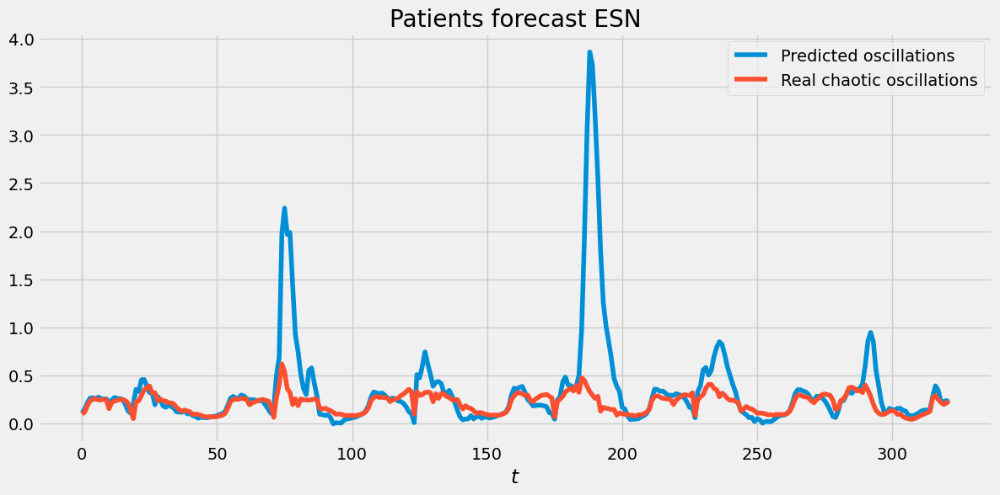

In [95]:
plt.figure(figsize=(13, 6))
plt.title("Patients forecast ESN")
plt.xlabel("$t$")
plt.plot(deep_preds, label="Predicted oscillations")
plt.plot(y_test_esn, label="Real chaotic oscillations")
plt.legend()

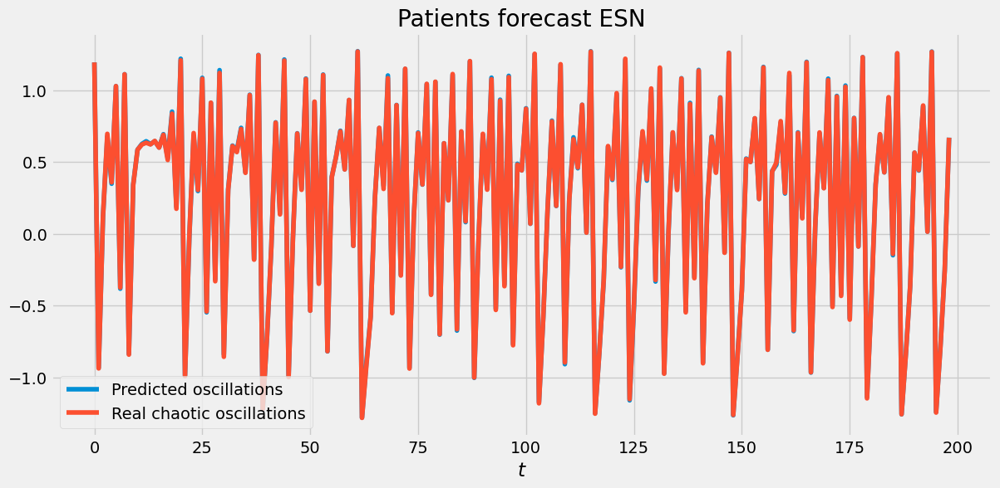

In [112]:
plt.figure(figsize=(13, 6))
plt.title("Patients forecast ESN")
plt.xlabel("$t$")
plt.plot(deep_preds_henon[:-1], label="Predicted oscillations")
plt.plot(y_test_esn_henon, label="Real chaotic oscillations")
plt.legend()

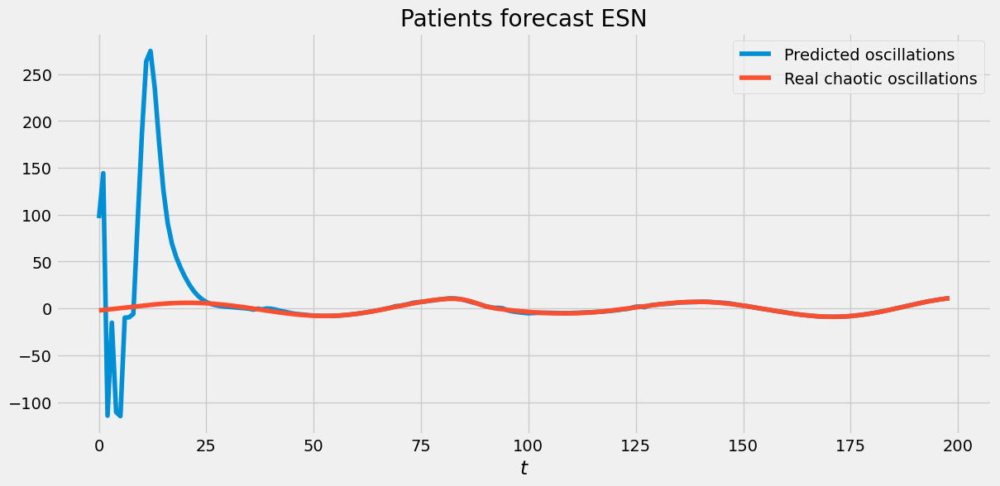

In [122]:
plt.figure(figsize=(13, 6))
plt.title("Patients forecast ESN")
plt.xlabel("$t$")
plt.plot(deep_preds_rossler[:-1], label="Predicted oscillations")
plt.plot(y_test_esn_rossler, label="Real chaotic oscillations")
plt.legend()

In [96]:
r2_desn = round(r2_score(y_test_esn, deep_preds), 3)
mse_desn = round(mean_squared_error(y_test_esn, deep_preds), 2)
mae_desn = round(mean_absolute_error(y_test_esn, deep_preds), 2)
r2_desn

-21.774

In [116]:
r2_desn_henon = round(r2_score(y_test_esn_henon, deep_preds_henon[:-1]), 3)
mse_desn_henon = round(mean_squared_error(y_test_esn_henon, deep_preds_henon[:-1]), 2)
mae_desn_henon = round(mean_absolute_error(y_test_esn_henon, deep_preds_henon[:-1]), 2)
r2_desn_henon

1.0

In [123]:
r2_desn_rossler = round(r2_score(y_test_esn_rossler, deep_preds_rossler[:-1]), 3)
mse_desn_rossler = round(mean_squared_error(y_test_esn_rossler, deep_preds_rossler[:-1]), 2)
mae_desn_rossler = round(mean_absolute_error(y_test_esn_rossler, deep_preds_rossler[:-1]), 2)
r2_desn_rossler

-61.389

## Hierarchical

In [124]:
from reservoirpy.nodes import Reservoir, Ridge, Input

reservoir1_hier = Reservoir(100, name="res1-hier", lr=0.8, sr=0.9, regularization = 1e-8)
reservoir2_hier = Reservoir(100, name="res2-hier", lr=0.5, sr=0.9, regularization = 1e-8)

readout1_hier = Ridge(ridge=1e-5, name="readout1-hier")
readout2_hier = Ridge(ridge=1e-5, name="readout2-hier")

In [125]:
model_hierarchical = reservoir1_hier >> readout1_hier >> reservoir2_hier >> readout2_hier

In [136]:
# model_hierarchical = model_hierarchical.fit(X_train_esn, {"readout1-hier": y_train_esn, "readout2-hier": y_train_esn}, warmup=100)
# model_hierarchical_henon = model_hierarchical.fit(X_train_esn_henon, {"readout1-hier": y_train_esn_henon, "readout2-hier": y_train_esn_henon})
model_hierarchical_rossler = model_hierarchical.fit(X_train_esn_rossler, {"readout1-hier": y_train_esn_rossler, "readout2-hier": y_train_esn_rossler})

Running Model-10:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-10: 800it [00:00, 11167.76it/s]          
Running Model-10: 100%|██████████| 1/1 [00:00<00:00,  7.41it/s]


Fitting node readout1-hier...


Running Model-10:   0%|          | 0/1 [00:00<?, ?it/s]
Running Model-10: 800it [00:00, 10010.51it/s]          
Running Model-10: 100%|██████████| 1/1 [00:00<00:00, 11.77it/s]


Fitting node readout2-hier...


In [137]:
esn_hier_pred = model_hierarchical.run(X_test_esn)
esn_hier_pred_henon = model_hierarchical.run(X_test_esn_henon)
esn_hier_pred_rossler = model_hierarchical.run(X_test_esn_rossler)

Running Model-10: 200it [00:00, 7475.21it/s]           


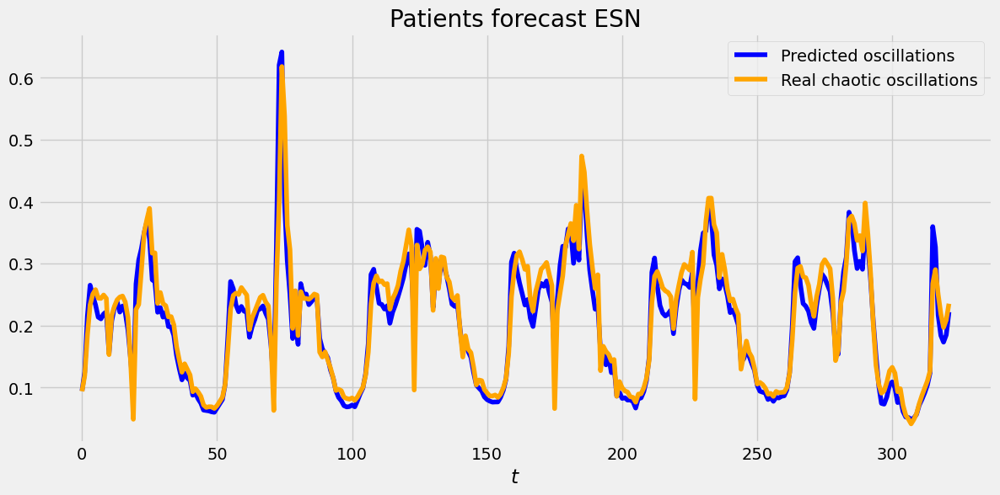

In [130]:
plt.figure(figsize=(13, 6))
plt.title("Patients forecast ESN")
plt.xlabel("$t$")
plt.plot(esn_hier_pred, label="Predicted oscillations", color="blue")
plt.plot(y_test_esn, label="Real chaotic oscillations", color="orange")
plt.legend()

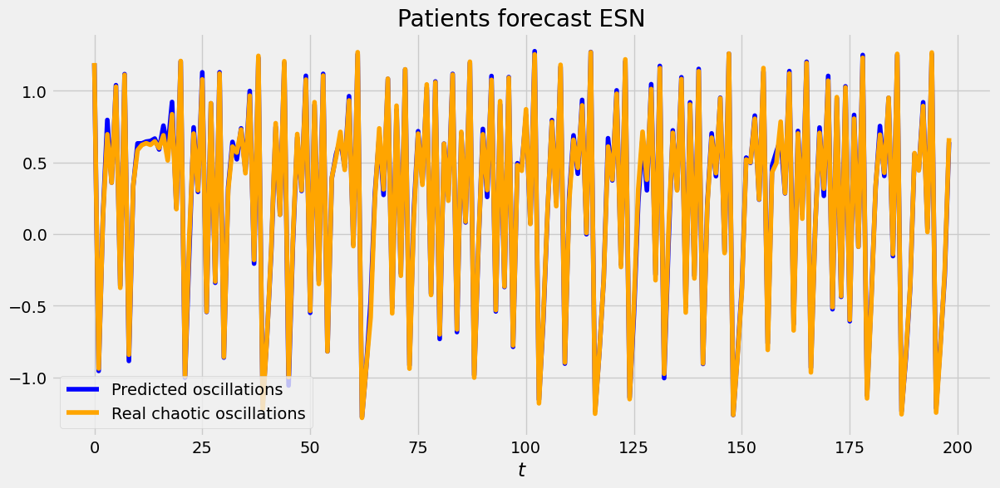

In [134]:
plt.figure(figsize=(13, 6))
plt.title("Patients forecast ESN")
plt.xlabel("$t$")
plt.plot(esn_hier_pred_henon[:-1], label="Predicted oscillations", color="blue")
plt.plot(y_test_esn_henon, label="Real chaotic oscillations", color="orange")
plt.legend()

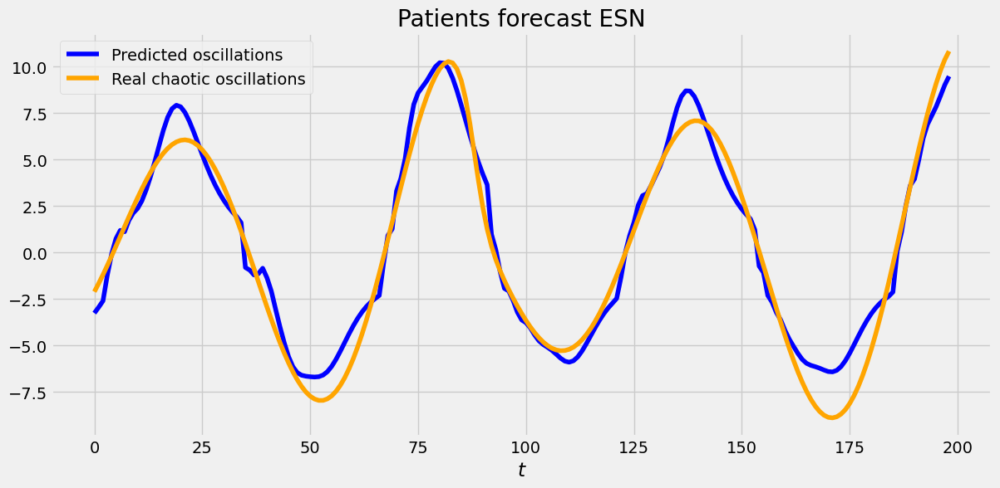

In [139]:
plt.figure(figsize=(13, 6))
plt.title("Patients forecast ESN")
plt.xlabel("$t$")
plt.plot(esn_hier_pred_rossler[:-1], label="Predicted oscillations", color="blue")
plt.plot(y_test_esn_rossler, label="Real chaotic oscillations", color="orange")
plt.legend()

In [131]:
r2_hesn = round(r2_score(y_test_esn, esn_hier_pred),3)
mse_hesn = round(mean_squared_error(y_test_esn, esn_hier_pred), 2)
mae_hesn = round(mean_absolute_error(y_test_esn, esn_hier_pred), 2)
r2_hesn, mse_hesn, mae_hesn

(0.906, 0.0, 0.02)

In [135]:
r2_hesn_henon = round(r2_score(y_test_esn_henon, esn_hier_pred_henon[:-1]), 3)
mse_hesn_henon = round(mean_squared_error(y_test_esn_henon, esn_hier_pred_henon[:-1]), 2)
mae_hesn_henon = round(mean_absolute_error(y_test_esn_henon, esn_hier_pred_henon[:-1]), 2)
r2_hesn_henon

0.998

In [138]:
r2_hesn_rossler = round(r2_score(y_test_esn_rossler, esn_hier_pred_rossler[:-1]), 3)
mse_hesn_rossler = round(mean_squared_error(y_test_esn_rossler, esn_hier_pred_rossler[:-1]), 2)
mae_hesn_rossler = round(mean_absolute_error(y_test_esn_rossler, esn_hier_pred_rossler[:-1]), 2)
r2_hesn_rossler

0.958

## FORCE

In [140]:
units = 100
leak_rate = 0.3
spectral_radius = 1.25
input_scaling = 1.0
connectivity = 0.1
input_connectivity = 0.2
seed = 23

In [141]:
from reservoirpy.nodes import FORCE

reservoir_force = Reservoir(units, input_scaling=input_scaling, sr=spectral_radius,
                      lr=leak_rate, rc_connectivity=connectivity,
                      input_connectivity=input_connectivity, seed=seed)

readout_force = FORCE(1)

In [143]:
esn_online = reservoir_force >> readout_force

In [1113]:
esn_online = reservoir_force >> readout_force
outputs_pre = np.zeros(X_train_esn.shape)
for t, (x, y) in enumerate(zip(X_train_esn, y_train_esn)):  # for each timestep of training data:
    outputs_pre[t, :] = esn_online.train(x, y)

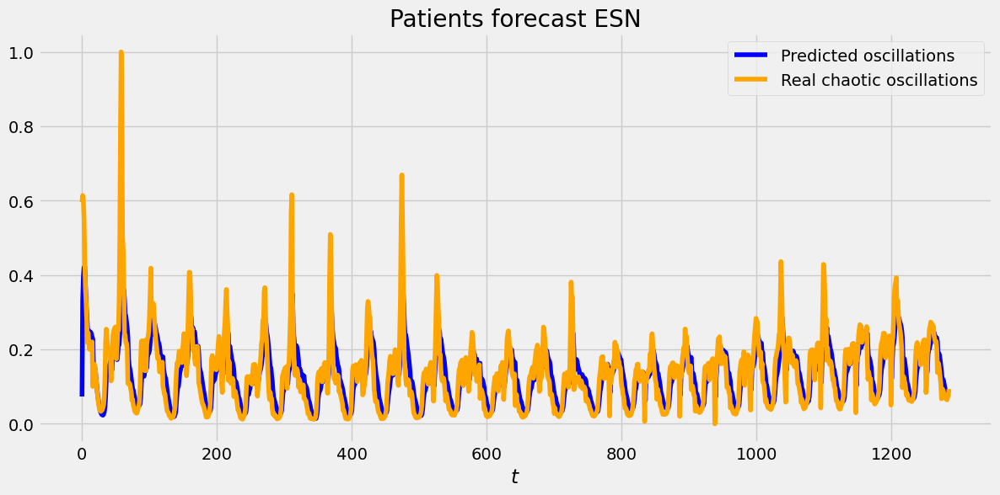

In [1114]:
plt.figure(figsize=(13, 6))
plt.title("Patients forecast ESN")
plt.xlabel("$t$")
plt.plot(outputs_pre, label="Predicted oscillations", color="blue")
plt.plot(y_train_esn, label="Real chaotic oscillations", color="orange")
plt.legend()

In [144]:
esn_online.train(X_train_esn, y_train_esn)
pred_online = esn_online.run(X_test_esn)

Running Model-11: 322it [00:00, 9579.98it/s]           


In [145]:
esn_online.train(X_train_esn_henon, y_train_esn_henon)
pred_online_henon = esn_online.run(X_test_esn_henon)

Running Model-11: 200it [00:00, 17120.31it/s]          


In [151]:
esn_online.train(X_train_esn_rossler, y_train_esn_rossler)
pred_online_rossler = esn_online.run(X_test_esn_rossler)

Running Model-11: 200it [00:00, 8662.52it/s]           


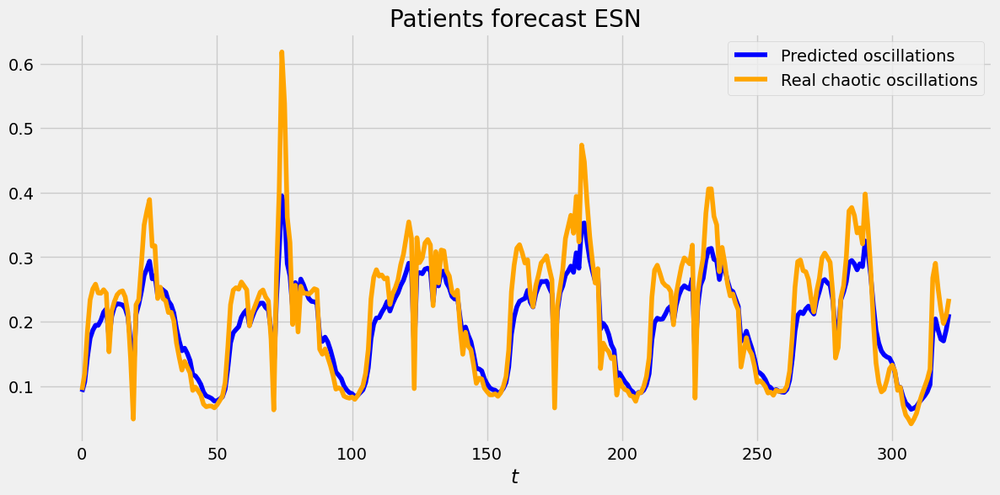

In [1587]:
plt.figure(figsize=(13, 6))
plt.title("Patients forecast ESN")
plt.xlabel("$t$")
plt.plot(pred_online, label="Predicted oscillations", color="blue") #scaler.inverse_transform(pred_online)
plt.plot(y_test_esn, label="Real chaotic oscillations", color="orange")
plt.legend()

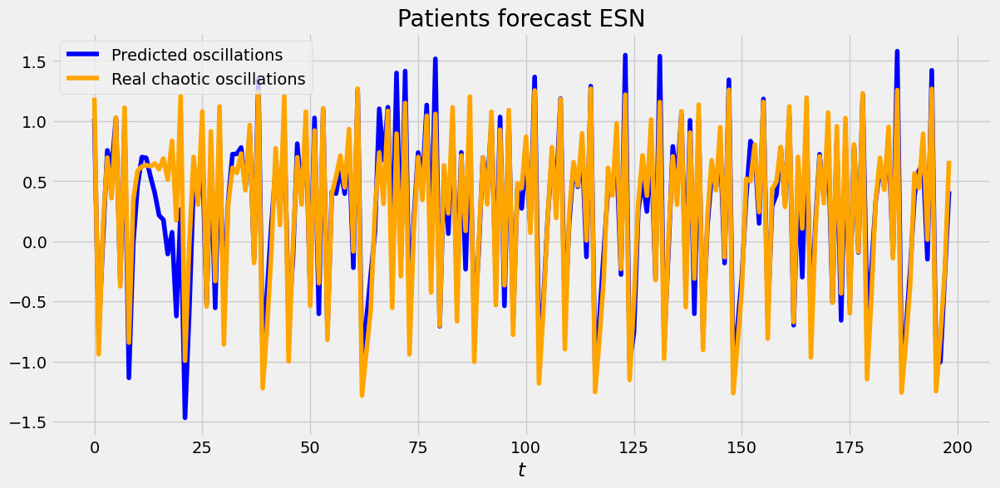

In [146]:
plt.figure(figsize=(13, 6))
plt.title("Patients forecast ESN")
plt.xlabel("$t$")
plt.plot(pred_online_henon[:-1], label="Predicted oscillations", color="blue") #scaler.inverse_transform(pred_online)
plt.plot(y_test_esn_henon, label="Real chaotic oscillations", color="orange")
plt.legend()

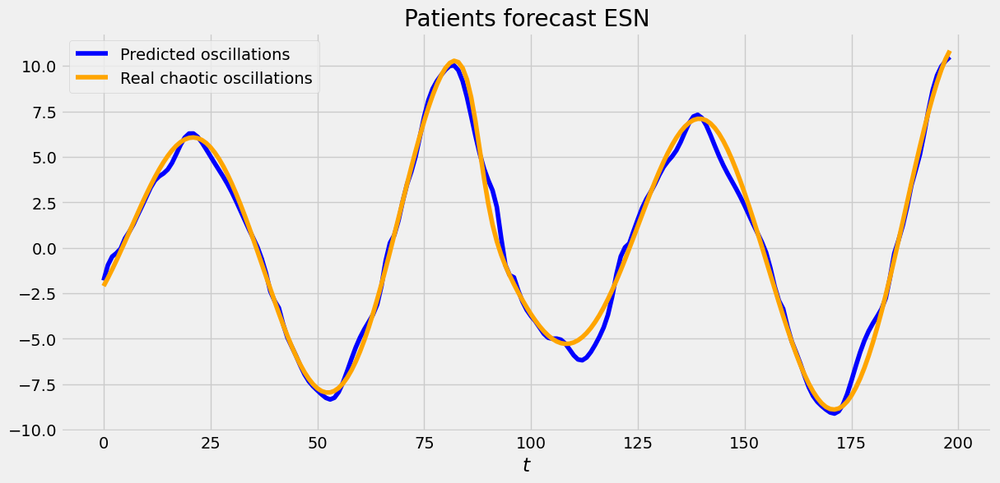

In [152]:
plt.figure(figsize=(13, 6))
plt.title("Patients forecast ESN")
plt.xlabel("$t$")
plt.plot(pred_online_rossler[:-1], label="Predicted oscillations", color="blue") #scaler.inverse_transform(pred_online)
plt.plot(y_test_esn_rossler, label="Real chaotic oscillations", color="orange")
plt.legend()

In [1589]:
r2_fesn = round(r2_score(y_test_esn, pred_online),3)
mse_fesn = round(mean_squared_error(y_test_esn, pred_online),2)
mae_fesn = round(mean_absolute_error(y_test_esn, pred_online),2)
r2_fesn

0.818

In [147]:
r2_fesn_henon = round(r2_score(y_test_esn_henon, pred_online_henon[:-1]),3)
mse_fesn_henon = round(mean_squared_error(y_test_esn_henon, pred_online_henon[:-1]),2)
mae_fesn_henon = round(mean_absolute_error(y_test_esn_henon, pred_online_henon[:-1]),2)
r2_fesn_henon

0.903

In [153]:
r2_fesn_rossler = round(r2_score(y_test_esn_rossler, pred_online_rossler[:-1]),3)
mse_fesn_rossler = round(mean_squared_error(y_test_esn_rossler, pred_online_rossler[:-1]),2)
mae_fesn_rossler = round(mean_absolute_error(y_test_esn_rossler, pred_online_rossler[:-1]),2)
r2_fesn_rossler

0.99

## Henon Map

Text(0.5, 1.0, 'Hénon Map')

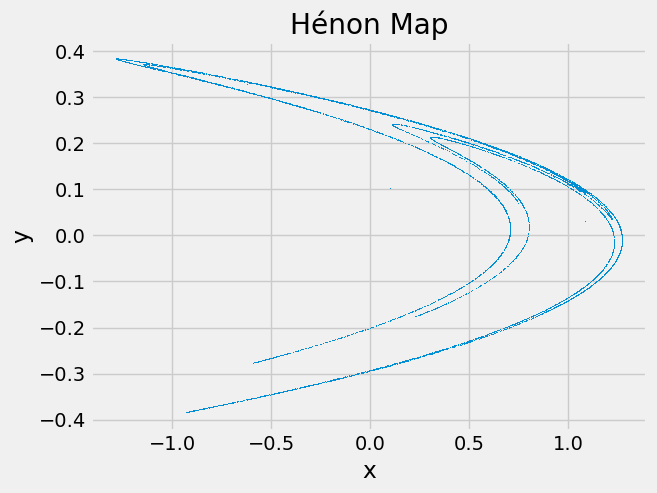

In [1120]:
import numpy as np
import matplotlib.pyplot as plt

# Hénon Map parameters
a = 1.4
b = 0.3

# Initial condition
x0, y0 = 0.1, 0.1
length = 10000

# Generate Hénon map
x, y = [x0], [y0]
for _ in range(length-1):
    x_next = 1 - a * x[-1]**2 + y[-1]
    y_next = b * x[-1]
    x.append(x_next)
    y.append(y_next)

# Plot the Hénon map
plt.plot(x, y, ',')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Hénon Map')

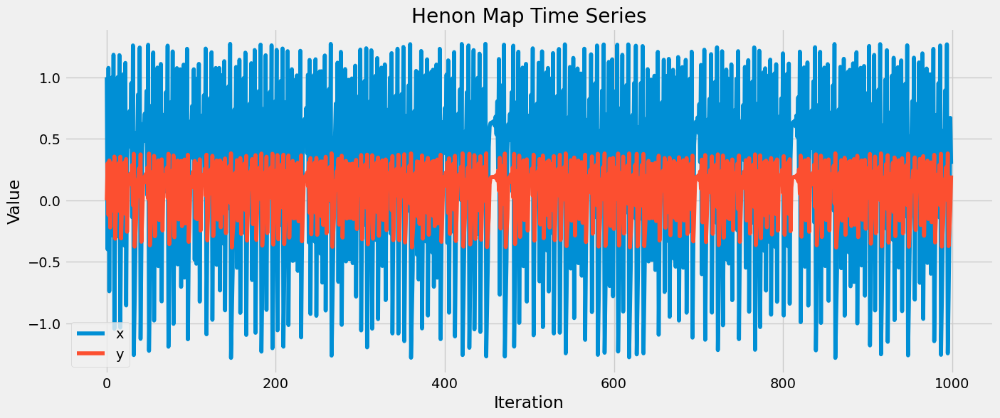

In [1119]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# Henon map parameters
a_henon = 1.4
b_henon = 0.3

# Initial conditions for Henon map
x_henon = 0
y_henon = 0

# Number of iterations for Henon map
n_iterations = 1000

# Arrays to store the Henon map time series
x_series_henon = np.zeros(n_iterations)
y_series_henon = np.zeros(n_iterations)

# Generate Henon map time series
for i in range(n_iterations):
    x_new = 1 - a_henon * x_henon ** 2 + y_henon
    y_new = b_henon * x_henon
    x_henon, y_henon = x_new, y_new
    x_series_henon[i] = x_henon
    y_series_henon[i] = y_henon

# Plot Henon map time series
plt.figure(figsize=(15, 6))
plt.plot(x_series_henon, label='x')
plt.plot(y_series_henon, label='y')
plt.title('Henon Map Time Series')
plt.xlabel('Iteration')
plt.ylabel('Value')
plt.legend()

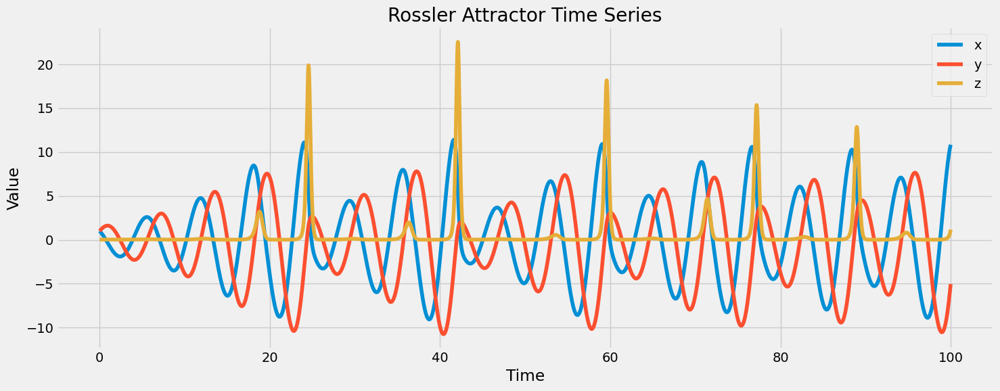

In [1141]:
# Rossler Attractor parameters
a_rossler = 0.2
b_rossler = 0.2
c_rossler = 5.7

# Time points for Rossler Attractor
t_start = 0
t_end = 100
t_points = np.linspace(t_start, t_end, 10000)

# Rossler Attractor equations
def rossler(t, state):
    x, y, z = state
    dxdt = -y - z
    dydt = x + a_rossler * y
    dzdt = b_rossler + z * (x - c_rossler)
    return [dxdt, dydt, dzdt]

# Initial conditions for Rossler Attractor
initial_state_rossler = [1, 1, 0]

# Solve the Rossler system
solution_rossler = solve_ivp(rossler, [t_start, t_end], initial_state_rossler, t_eval=t_points)

# Plot Rossler Attractor time series
plt.figure(figsize=(15, 6))
plt.plot(solution_rossler.t, solution_rossler.y[0], label='x')
plt.plot(solution_rossler.t, solution_rossler.y[1], label='y')
plt.plot(solution_rossler.t, solution_rossler.y[2], label='z')
plt.title('Rossler Attractor Time Series')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.tight_layout()

In [1156]:
from reservoirpy.datasets import rossler

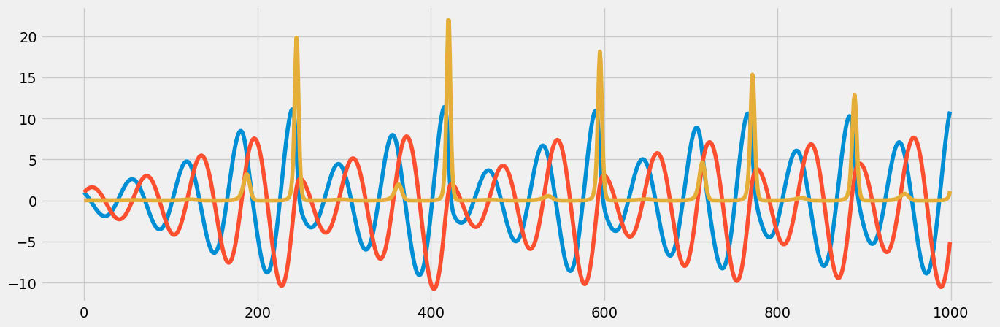

In [1162]:
plt.figure(figsize=(15,5))
plt.plot(rossler(1000, x0=[1, 1, 0]))

Text(0.5, 1.0, 'Rossler Attractor on x, y plane')

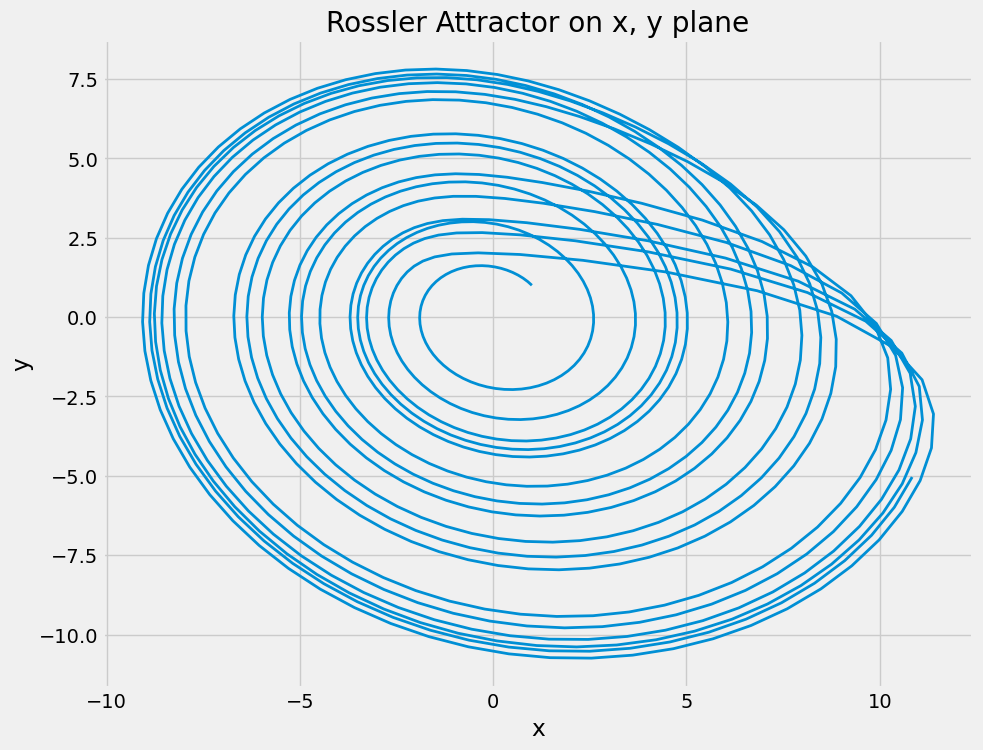

In [1364]:
plt.figure(figsize=(10,8))
plt.plot(rossler_attractor[:, 0], rossler_attractor[:, 1], linewidth=2)
plt.xlabel('x')
plt.ylabel('y')
plt.title('Rossler Attractor on x, y plane')

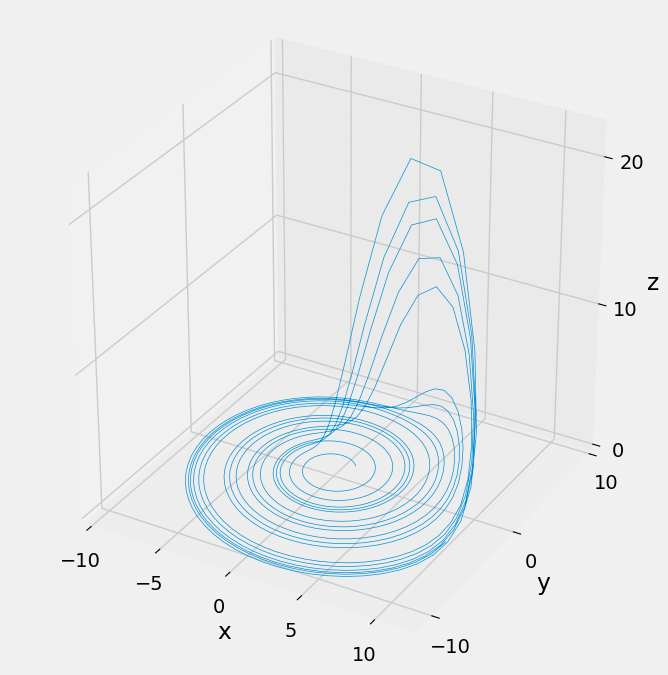

In [1386]:
fig = plt.figure(figsize=(9, 8))
ax = fig.add_subplot(projection='3d')
ax.plot(rossler_attractor[:, 0], rossler_attractor[:, 1], rossler_attractor[:, 2], lw=0.5)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
ax.set_zticks([0, 10, 20])
ax.set_yticks([-10, 0 ,10])
ax.set_box_aspect(aspect=(1, 1, 1))

## Summarize for Henon

## Summarize for Rossler

## Summarize for Patients

In [1560]:
LSTM_GRU = pd.read_csv('LSTM_GRU_FLU.csv', index_col = 0)
LSTM_GRU.index = pd.to_datetime(LSTM_GRU.index)
LSTM_GRU.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 317 entries, 2014-08-17 to 2020-09-06
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   LSTM    317 non-null    float64
 1   GRU     317 non-null    float64
dtypes: float64(2)
memory usage: 7.4 KB


In [ ]:
LSTM_GRU = LSTM_GRU.set_

In [1558]:
y_test.head()

date
2014-08-31    16139
2014-09-07    20057
2014-09-14    30122
2014-09-21    37589
2014-09-28    40231
Name: Всего, dtype: int64

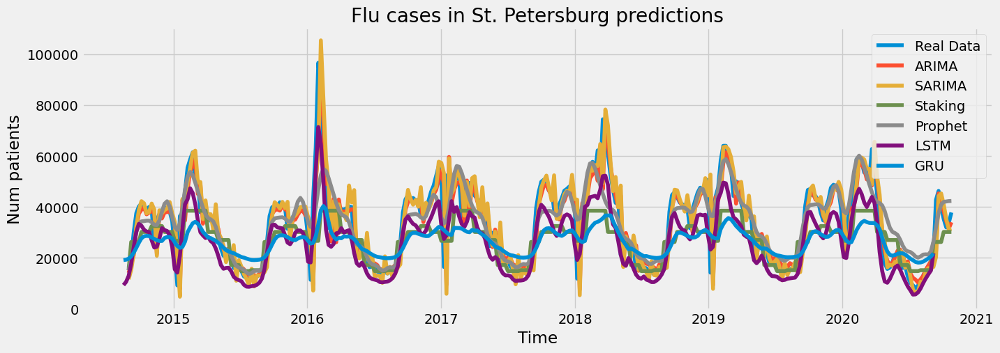

In [1561]:
plt.figure(figsize=(15,5))
plt.plot(y_test, label = 'Real Data')
plt.plot(predictions, label = 'ARIMA')
plt.plot(predictions_sarima, label = 'SARIMA')
plt.plot(stack_pred, label = 'Staking')
plt.plot(forecast.set_index('ds')[y_train.shape[0]:]['yhat'], label = 'Prophet')
plt.plot(LSTM_GRU['LSTM'], label = 'LSTM')
plt.plot(LSTM_GRU['GRU'], label = 'GRU')
# plt.plot(pd.DataFrame(scaler.inverse_transform(esn_preds), index = y_test.index), label = 'ESN')
# plt.plot(pd.DataFrame(scaler.inverse_transform(deep_preds), index = y_test.index), label = 'DESN')
# plt.plot(pd.DataFrame(scaler.inverse_transform(esn_hier_pred), index = y_test.index), label = 'HESN')
# plt.plot(pd.DataFrame(scaler.inverse_transform(pred_online), index = y_test.index), label = 'FORCE ESN')

plt.title('Flu cases in St. Petersburg predictions')
plt.xlabel('Time')
plt.ylabel('Num patients')
plt.legend()

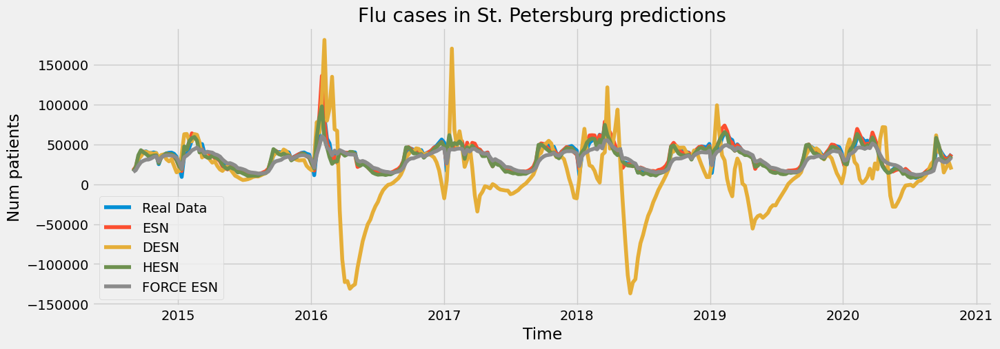

In [1547]:
plt.figure(figsize=(15,5))
plt.plot(y_test, label = 'Real Data')
plt.plot(pd.DataFrame(scaler.inverse_transform(esn_preds), index = y_test.index), label = 'ESN')
plt.plot(pd.DataFrame(scaler.inverse_transform(deep_preds), index = y_test.index), label = 'DESN')
plt.plot(pd.DataFrame(scaler.inverse_transform(esn_hier_pred), index = y_test.index), label = 'HESN')
plt.plot(pd.DataFrame(scaler.inverse_transform(pred_online), index = y_test.index), label = 'FORCE ESN')

plt.title('Flu cases in St. Petersburg predictions')
plt.xlabel('Time')
plt.ylabel('Num patients')
plt.legend()

In [1563]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [1601]:
df_metrics_flu = pd.DataFrame({'Model':['ARIMA', 'SARIMA', 'Prophet', 'Stacking',
                                        'LSTM', 'GRU', 'ESN', 'HESN', 'DESN', 'FESN'],
                               'R_2':[r2_arima, r2_sarima, r2_prop, r2_stack, r2_lstm, r2_gru, r2_esn, r2_hesn, r2_desn, r2_fesn],
                               'MSE':[mse_arima, mse_sarima, mse_prop, mse_stack, mse_lstm, mse_gru, mse_esn, mse_hesn, mse_desn, mse_fesn],
                               'MAE':[mae_arima, mae_sarima, mae_prop, mae_stack, mae_lstm, mae_gru, mae_esn, mae_hesn, mae_desn, mae_fesn]
                               })

In [1605]:
df_metrics_flu
# df_metrics_flu.to_csv('flu_table.csv')

,Model,R_2,MSE,MAE
0,ARIMA,0.721,6.323290e+07,4782.27
1,SARIMA,0.661,0.000000e+00,0.03
2,Prophet,0.740,5.899858e+07,5004.42
3,Stacking,0.340,1.497533e+08,9043.87
4,LSTM,0.636,8.458550e+07,8153.90
5,GRU,0.216,1.823235e+08,10806.16
6,ESN,0.922,0.000000e+00,0.02
7,HESN,0.892,0.000000e+00,0.02
8,DESN,-1.600,0.000000e+00,0.02
9,FESN,0.818,0.000000e+00,0.03


In [175]:
df_metrics_henon = pd.DataFrame({'Model':['ARIMA', 'SARIMA', 'Stacking',
                                        'LSTM', 'GRU', 'ESN', 'HESN', 'DESN', 'FESN'],
                                 'R_2':[r2_henon_arima, r2_henon_sarima, r2_stack_henon, r2_henon_lstm, r2_henon_gru, r2_esn_henon, r2_hesn_henon, r2_desn_henon, r2_fesn_henon],
                               'MSE':[mse_henon_arima, mse_henon_sarima, mse_stack_henon, mse_henon_lstm, mse_henon_gru, mse_esn_henon, mse_hesn_henon, mse_desn_henon, mse_fesn_henon],
                               'MAE':[mae_henon_arima, mae_henon_sarima, mae_stack_henon, mae_henon_lstm, mae_henon_gru, mae_esn_henon, mae_hesn_henon, mae_desn_henon, mae_fesn_henon]
                                 })

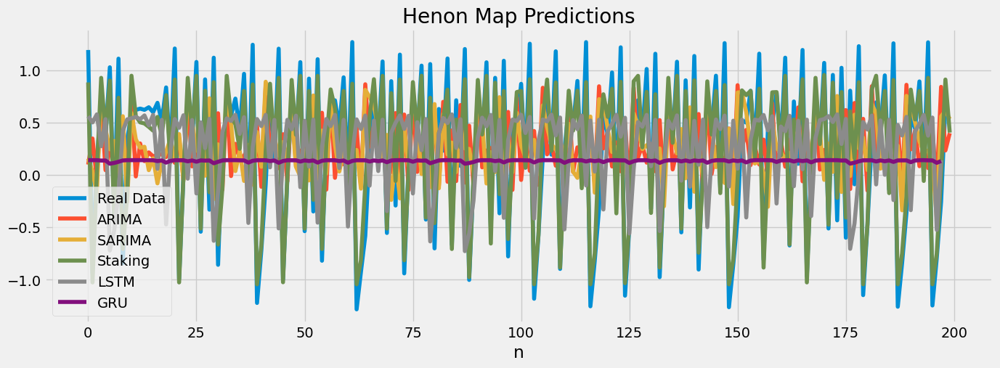

In [183]:
plt.figure(figsize=(15,5))
plt.plot(y_test_esn_henon, label = 'Real Data')
plt.plot(predictions_henon_arima, label = 'ARIMA')
plt.plot(predictions_sarima_henon, label = 'SARIMA')
plt.plot(stack_pred_henon, label = 'Staking')
plt.plot(lstm_henon['LSTM'], label = 'LSTM')
plt.plot(lstm_henon['GRU'], label = 'GRU')
# plt.plot(esn_preds_henon, label = 'ESN')
# plt.plot(deep_preds_henon, label = 'DESN')
# plt.plot(esn_hier_pred_henon, label = 'HESN')
# plt.plot(pred_online_henon, label = 'FORCE ESN')

plt.title('Henon Map Predictions')
plt.xlabel('n')
plt.legend()

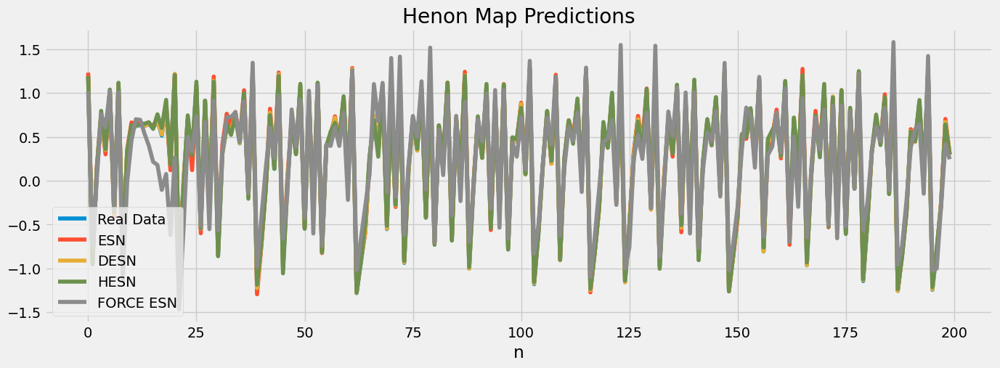

In [184]:
plt.figure(figsize=(15,5))
plt.plot(y_test_esn_henon, label = 'Real Data')
plt.plot(esn_preds_henon, label = 'ESN')
plt.plot(deep_preds_henon, label = 'DESN')
plt.plot(esn_hier_pred_henon, label = 'HESN')
plt.plot(pred_online_henon, label = 'FORCE ESN')

plt.title('Henon Map Predictions')
plt.xlabel('n')
plt.legend()

In [176]:
df_metrics_henon
df_metrics_henon.to_csv('henon_table.csv')

In [180]:
df_metrics_rossler = pd.DataFrame({'Model':['ARIMA', 'SARIMA', 'Stacking',
                                        'LSTM', 'GRU', 'ESN', 'HESN', 'DESN', 'FESN'],
                                 'R_2':[r2_rossler_arima, r2_rossler_sarima, r2_stack_rossler, r2_rossler_lstm, r2_rossler_gru, r2_esn_rossler, r2_hesn_rossler, r2_desn_rossler, r2_fesn_rossler],
                               'MSE':[mse_rossler_arima, mse_rossler_sarima, mse_stack_rossler, mse__rossler_lstm, mse_rossler_gru, mse_esn_rossler, mse_hesn_rossler, mse_desn_rossler, mse_fesn_rossler],
                               'MAE':[mae_rossler_arima, mae_rossler_sarima, mae_stack_rossler, mae_rossler_lstm, mae_rossler_gru, mae_esn_rossler, mae_hesn_rossler, mae_desn_rossler, mae_fesn_rossler]
                                 })

In [181]:
df_metrics_rossler
df_metrics_rossler.to_csv('rossler_table.csv')

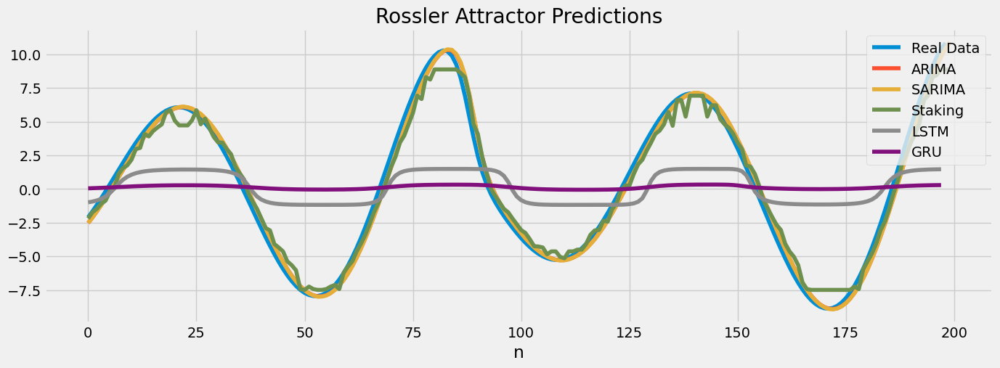

In [189]:
plt.figure(figsize=(15,5))
plt.plot(y_test_esn_rossler, label = 'Real Data')
plt.plot(predictions_rosler_arima, label = 'ARIMA')
plt.plot(predictions_rosler_sarima, label = 'SARIMA')
plt.plot(stack_pred_rossler, label = 'Staking')
plt.plot(lstm_rossler['LSTM'], label = 'LSTM')
plt.plot(lstm_rossler['GRU'], label = 'GRU')
# plt.plot(esn_preds_henon, label = 'ESN')
# plt.plot(deep_preds_henon, label = 'DESN')
# plt.plot(esn_hier_pred_henon, label = 'HESN')
# plt.plot(pred_online_henon, label = 'FORCE ESN')

plt.title('Rossler Attractor Predictions')
plt.xlabel('n')
plt.legend(loc='upper right')

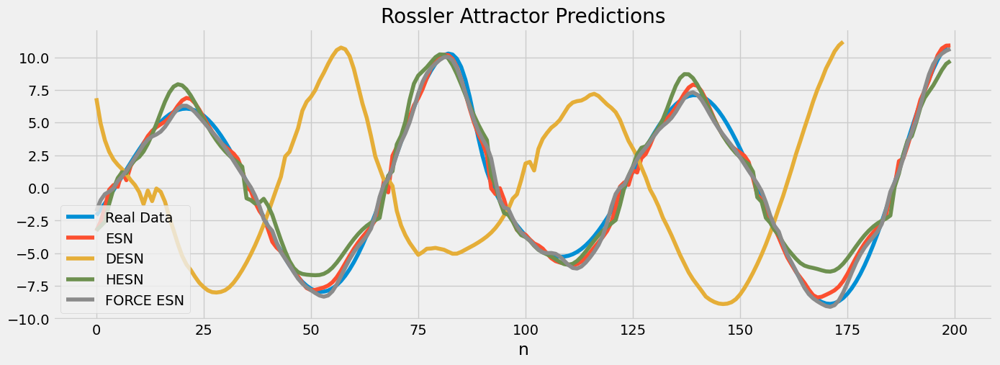

In [186]:
plt.figure(figsize=(15,5))
plt.plot(y_test_esn_rossler, label = 'Real Data')
plt.plot(esn_preds_rossler, label = 'ESN')
plt.plot(deep_preds_rossler[25:], label = 'DESN')
plt.plot(esn_hier_pred_rossler, label = 'HESN')
plt.plot(pred_online_rossler, label = 'FORCE ESN')

plt.title('Rossler Attractor Predictions')
plt.xlabel('n')
plt.legend()